# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:13<00:00, 4.56KFile/s] 


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

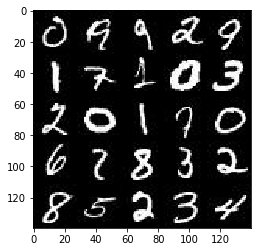

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

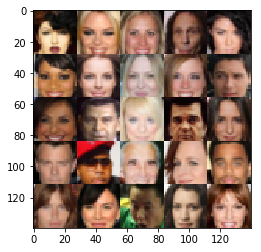

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    inputs_real = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, shape=(None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    return inputs_real, inputs_z, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*256)

        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x256 now
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        # 28x28xdim now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images *= 2.0
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z})

                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i + 1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5885... Generator Loss: 2.1361
Epoch 1/2... Discriminator Loss: 0.3540... Generator Loss: 2.3829
Epoch 1/2... Discriminator Loss: 3.3189... Generator Loss: 1.7753
Epoch 1/2... Discriminator Loss: 3.4596... Generator Loss: 0.3815
Epoch 1/2... Discriminator Loss: 2.2707... Generator Loss: 0.9493
Epoch 1/2... Discriminator Loss: 0.1949... Generator Loss: 2.2371
Epoch 1/2... Discriminator Loss: 0.2640... Generator Loss: 2.7132
Epoch 1/2... Discriminator Loss: 2.2000... Generator Loss: 4.0894
Epoch 1/2... Discriminator Loss: 2.3892... Generator Loss: 3.4035
Epoch 1/2... Discriminator Loss: 1.1988... Generator Loss: 1.3119


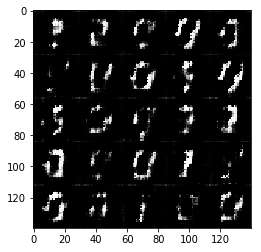

Epoch 1/2... Discriminator Loss: 1.0477... Generator Loss: 1.2154
Epoch 1/2... Discriminator Loss: 3.1433... Generator Loss: 6.6706
Epoch 1/2... Discriminator Loss: 1.6368... Generator Loss: 1.0369
Epoch 1/2... Discriminator Loss: 0.8908... Generator Loss: 2.4926
Epoch 1/2... Discriminator Loss: 1.9212... Generator Loss: 0.4027
Epoch 1/2... Discriminator Loss: 1.3517... Generator Loss: 0.5283
Epoch 1/2... Discriminator Loss: 0.8526... Generator Loss: 0.9418
Epoch 1/2... Discriminator Loss: 1.3254... Generator Loss: 0.6176
Epoch 1/2... Discriminator Loss: 0.6522... Generator Loss: 1.8045
Epoch 1/2... Discriminator Loss: 0.2808... Generator Loss: 2.4370


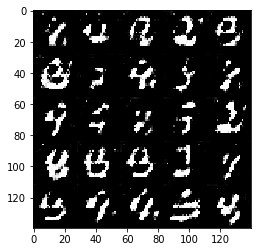

Epoch 1/2... Discriminator Loss: 1.7611... Generator Loss: 4.6559
Epoch 1/2... Discriminator Loss: 1.1161... Generator Loss: 0.6345
Epoch 1/2... Discriminator Loss: 2.0202... Generator Loss: 4.3801
Epoch 1/2... Discriminator Loss: 0.6090... Generator Loss: 1.3127
Epoch 1/2... Discriminator Loss: 0.7369... Generator Loss: 2.0730
Epoch 1/2... Discriminator Loss: 0.9395... Generator Loss: 1.6272
Epoch 1/2... Discriminator Loss: 1.8095... Generator Loss: 2.6904
Epoch 1/2... Discriminator Loss: 0.8435... Generator Loss: 1.9740
Epoch 1/2... Discriminator Loss: 1.0192... Generator Loss: 1.8784
Epoch 1/2... Discriminator Loss: 1.3496... Generator Loss: 0.6935


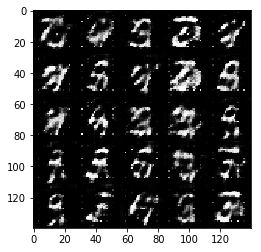

Epoch 1/2... Discriminator Loss: 0.8814... Generator Loss: 1.0475
Epoch 1/2... Discriminator Loss: 1.5377... Generator Loss: 3.2007
Epoch 1/2... Discriminator Loss: 0.9594... Generator Loss: 1.3725
Epoch 1/2... Discriminator Loss: 0.8105... Generator Loss: 1.3221
Epoch 1/2... Discriminator Loss: 0.9667... Generator Loss: 1.2499
Epoch 1/2... Discriminator Loss: 0.9352... Generator Loss: 1.4476
Epoch 1/2... Discriminator Loss: 1.2656... Generator Loss: 2.8429
Epoch 1/2... Discriminator Loss: 0.6797... Generator Loss: 1.6055
Epoch 1/2... Discriminator Loss: 0.8331... Generator Loss: 1.6195
Epoch 1/2... Discriminator Loss: 1.7518... Generator Loss: 0.3587


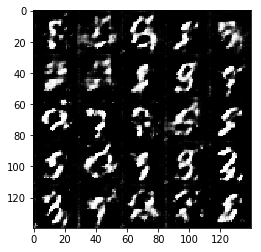

Epoch 1/2... Discriminator Loss: 0.5955... Generator Loss: 1.1986
Epoch 1/2... Discriminator Loss: 0.4176... Generator Loss: 2.3471
Epoch 1/2... Discriminator Loss: 0.6043... Generator Loss: 1.5475
Epoch 1/2... Discriminator Loss: 1.0198... Generator Loss: 0.8830
Epoch 1/2... Discriminator Loss: 1.6707... Generator Loss: 3.3334
Epoch 1/2... Discriminator Loss: 0.7650... Generator Loss: 1.3579
Epoch 1/2... Discriminator Loss: 1.0360... Generator Loss: 2.1908
Epoch 1/2... Discriminator Loss: 1.0105... Generator Loss: 1.1925
Epoch 1/2... Discriminator Loss: 1.0912... Generator Loss: 2.0354
Epoch 1/2... Discriminator Loss: 0.9226... Generator Loss: 1.9374


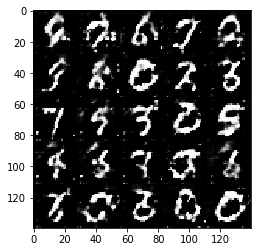

Epoch 1/2... Discriminator Loss: 0.8450... Generator Loss: 1.0459
Epoch 1/2... Discriminator Loss: 1.1955... Generator Loss: 0.5678
Epoch 1/2... Discriminator Loss: 1.0376... Generator Loss: 3.1295
Epoch 1/2... Discriminator Loss: 1.0570... Generator Loss: 0.9237
Epoch 1/2... Discriminator Loss: 0.8160... Generator Loss: 2.1772
Epoch 1/2... Discriminator Loss: 0.8364... Generator Loss: 1.0544
Epoch 1/2... Discriminator Loss: 0.8184... Generator Loss: 1.1286
Epoch 1/2... Discriminator Loss: 1.0463... Generator Loss: 1.2896
Epoch 1/2... Discriminator Loss: 0.8178... Generator Loss: 2.1864
Epoch 1/2... Discriminator Loss: 0.6583... Generator Loss: 1.4508


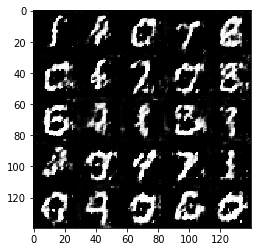

Epoch 1/2... Discriminator Loss: 0.8428... Generator Loss: 1.0185
Epoch 1/2... Discriminator Loss: 1.2481... Generator Loss: 2.9860
Epoch 1/2... Discriminator Loss: 0.6756... Generator Loss: 1.5597
Epoch 1/2... Discriminator Loss: 0.7933... Generator Loss: 1.8596
Epoch 1/2... Discriminator Loss: 1.2614... Generator Loss: 0.7925
Epoch 1/2... Discriminator Loss: 0.7012... Generator Loss: 1.1482
Epoch 1/2... Discriminator Loss: 0.6109... Generator Loss: 1.6897
Epoch 1/2... Discriminator Loss: 1.3095... Generator Loss: 0.4608
Epoch 1/2... Discriminator Loss: 0.8177... Generator Loss: 2.1313
Epoch 1/2... Discriminator Loss: 0.9156... Generator Loss: 2.7063


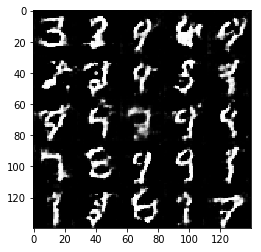

Epoch 1/2... Discriminator Loss: 1.3663... Generator Loss: 3.7744
Epoch 1/2... Discriminator Loss: 0.9488... Generator Loss: 0.8721
Epoch 1/2... Discriminator Loss: 1.2669... Generator Loss: 0.4943
Epoch 1/2... Discriminator Loss: 0.6521... Generator Loss: 1.3587
Epoch 1/2... Discriminator Loss: 0.7501... Generator Loss: 1.5955
Epoch 1/2... Discriminator Loss: 0.7769... Generator Loss: 1.7811
Epoch 1/2... Discriminator Loss: 0.7611... Generator Loss: 1.3199
Epoch 1/2... Discriminator Loss: 0.9429... Generator Loss: 0.8291
Epoch 1/2... Discriminator Loss: 0.7613... Generator Loss: 1.2066
Epoch 1/2... Discriminator Loss: 0.8679... Generator Loss: 1.2663


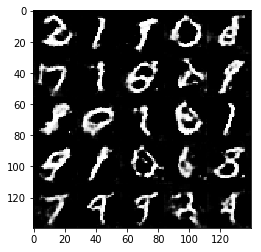

Epoch 1/2... Discriminator Loss: 0.7939... Generator Loss: 2.4571
Epoch 1/2... Discriminator Loss: 0.7086... Generator Loss: 1.3987
Epoch 1/2... Discriminator Loss: 0.8795... Generator Loss: 1.0286
Epoch 1/2... Discriminator Loss: 0.7886... Generator Loss: 1.1548
Epoch 1/2... Discriminator Loss: 1.4486... Generator Loss: 0.5025
Epoch 1/2... Discriminator Loss: 1.2906... Generator Loss: 0.5266
Epoch 1/2... Discriminator Loss: 0.8888... Generator Loss: 0.9143
Epoch 1/2... Discriminator Loss: 1.0774... Generator Loss: 3.2885
Epoch 1/2... Discriminator Loss: 0.8049... Generator Loss: 1.4772
Epoch 1/2... Discriminator Loss: 0.6815... Generator Loss: 2.2550


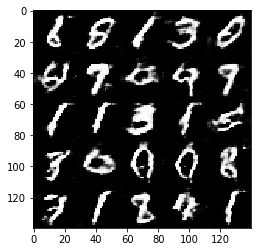

Epoch 1/2... Discriminator Loss: 1.9913... Generator Loss: 0.2250
Epoch 1/2... Discriminator Loss: 0.8153... Generator Loss: 1.7498
Epoch 1/2... Discriminator Loss: 0.7806... Generator Loss: 1.2892
Epoch 2/2... Discriminator Loss: 0.7374... Generator Loss: 1.9403
Epoch 2/2... Discriminator Loss: 0.9891... Generator Loss: 2.0269
Epoch 2/2... Discriminator Loss: 1.3776... Generator Loss: 2.9935
Epoch 2/2... Discriminator Loss: 0.6433... Generator Loss: 1.2793
Epoch 2/2... Discriminator Loss: 1.3901... Generator Loss: 0.5425
Epoch 2/2... Discriminator Loss: 0.7037... Generator Loss: 1.0839
Epoch 2/2... Discriminator Loss: 0.7438... Generator Loss: 1.2573


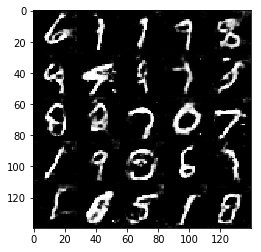

Epoch 2/2... Discriminator Loss: 1.0705... Generator Loss: 3.4674
Epoch 2/2... Discriminator Loss: 0.7464... Generator Loss: 1.1964
Epoch 2/2... Discriminator Loss: 0.5709... Generator Loss: 2.0322
Epoch 2/2... Discriminator Loss: 1.0525... Generator Loss: 1.0556
Epoch 2/2... Discriminator Loss: 1.1345... Generator Loss: 0.8347
Epoch 2/2... Discriminator Loss: 0.6905... Generator Loss: 1.6537
Epoch 2/2... Discriminator Loss: 0.8993... Generator Loss: 1.0099
Epoch 2/2... Discriminator Loss: 0.6929... Generator Loss: 1.0843
Epoch 2/2... Discriminator Loss: 0.6728... Generator Loss: 1.5142
Epoch 2/2... Discriminator Loss: 1.0302... Generator Loss: 0.7452


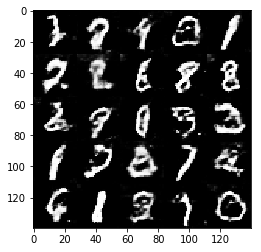

Epoch 2/2... Discriminator Loss: 0.6889... Generator Loss: 2.2760
Epoch 2/2... Discriminator Loss: 0.9052... Generator Loss: 0.8331
Epoch 2/2... Discriminator Loss: 0.9402... Generator Loss: 0.9250
Epoch 2/2... Discriminator Loss: 0.6500... Generator Loss: 1.1862
Epoch 2/2... Discriminator Loss: 0.6869... Generator Loss: 1.3512
Epoch 2/2... Discriminator Loss: 0.7728... Generator Loss: 2.7170
Epoch 2/2... Discriminator Loss: 0.6993... Generator Loss: 1.2666
Epoch 2/2... Discriminator Loss: 0.5709... Generator Loss: 1.2838
Epoch 2/2... Discriminator Loss: 0.6993... Generator Loss: 2.4747
Epoch 2/2... Discriminator Loss: 0.9225... Generator Loss: 0.8516


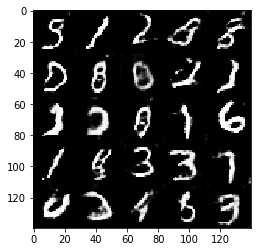

Epoch 2/2... Discriminator Loss: 0.5575... Generator Loss: 1.4730
Epoch 2/2... Discriminator Loss: 0.6131... Generator Loss: 1.9611
Epoch 2/2... Discriminator Loss: 0.9727... Generator Loss: 0.8040
Epoch 2/2... Discriminator Loss: 0.7772... Generator Loss: 2.6378
Epoch 2/2... Discriminator Loss: 0.7181... Generator Loss: 1.1368
Epoch 2/2... Discriminator Loss: 0.7111... Generator Loss: 1.2286
Epoch 2/2... Discriminator Loss: 1.0431... Generator Loss: 0.6789
Epoch 2/2... Discriminator Loss: 0.7677... Generator Loss: 1.0505
Epoch 2/2... Discriminator Loss: 0.8611... Generator Loss: 0.8682
Epoch 2/2... Discriminator Loss: 0.7329... Generator Loss: 1.1273


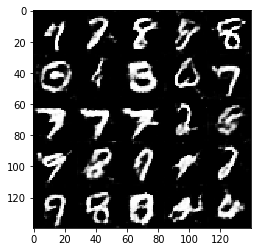

Epoch 2/2... Discriminator Loss: 0.5938... Generator Loss: 1.4178
Epoch 2/2... Discriminator Loss: 0.6653... Generator Loss: 1.8845
Epoch 2/2... Discriminator Loss: 0.5605... Generator Loss: 1.7279
Epoch 2/2... Discriminator Loss: 4.4204... Generator Loss: 0.0470
Epoch 2/2... Discriminator Loss: 0.5090... Generator Loss: 2.3498
Epoch 2/2... Discriminator Loss: 0.3966... Generator Loss: 2.2342
Epoch 2/2... Discriminator Loss: 0.6848... Generator Loss: 1.7664
Epoch 2/2... Discriminator Loss: 0.7291... Generator Loss: 0.9268
Epoch 2/2... Discriminator Loss: 0.8027... Generator Loss: 1.6312
Epoch 2/2... Discriminator Loss: 0.5704... Generator Loss: 1.7138


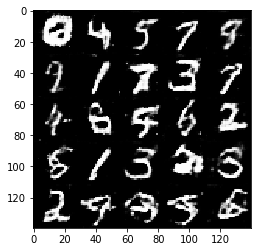

Epoch 2/2... Discriminator Loss: 0.3507... Generator Loss: 2.0805
Epoch 2/2... Discriminator Loss: 1.6980... Generator Loss: 0.7172
Epoch 2/2... Discriminator Loss: 0.8454... Generator Loss: 2.2950
Epoch 2/2... Discriminator Loss: 0.8441... Generator Loss: 0.8491
Epoch 2/2... Discriminator Loss: 1.0979... Generator Loss: 0.6861
Epoch 2/2... Discriminator Loss: 0.6896... Generator Loss: 1.1830
Epoch 2/2... Discriminator Loss: 0.6100... Generator Loss: 2.0088
Epoch 2/2... Discriminator Loss: 0.8262... Generator Loss: 1.3371
Epoch 2/2... Discriminator Loss: 0.6435... Generator Loss: 1.7417
Epoch 2/2... Discriminator Loss: 0.5906... Generator Loss: 1.2293


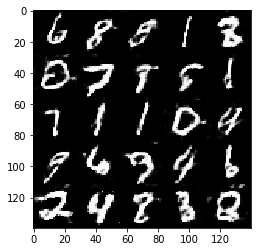

Epoch 2/2... Discriminator Loss: 0.8624... Generator Loss: 0.8893
Epoch 2/2... Discriminator Loss: 1.4433... Generator Loss: 4.3778
Epoch 2/2... Discriminator Loss: 1.3200... Generator Loss: 0.5258
Epoch 2/2... Discriminator Loss: 1.5857... Generator Loss: 0.3986
Epoch 2/2... Discriminator Loss: 1.3124... Generator Loss: 0.5491
Epoch 2/2... Discriminator Loss: 1.1221... Generator Loss: 0.7142
Epoch 2/2... Discriminator Loss: 1.2228... Generator Loss: 0.5322
Epoch 2/2... Discriminator Loss: 0.8726... Generator Loss: 0.8280
Epoch 2/2... Discriminator Loss: 0.5362... Generator Loss: 1.5183
Epoch 2/2... Discriminator Loss: 1.0060... Generator Loss: 0.6823


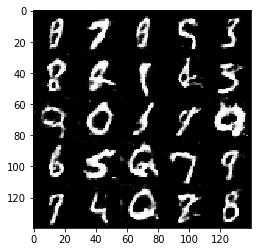

Epoch 2/2... Discriminator Loss: 0.3640... Generator Loss: 2.7143
Epoch 2/2... Discriminator Loss: 3.0812... Generator Loss: 7.4507
Epoch 2/2... Discriminator Loss: 0.6141... Generator Loss: 1.3022
Epoch 2/2... Discriminator Loss: 0.5955... Generator Loss: 2.1301
Epoch 2/2... Discriminator Loss: 1.0534... Generator Loss: 0.6458
Epoch 2/2... Discriminator Loss: 0.4634... Generator Loss: 2.1934
Epoch 2/2... Discriminator Loss: 1.3439... Generator Loss: 2.9602
Epoch 2/2... Discriminator Loss: 0.9505... Generator Loss: 2.6281
Epoch 2/2... Discriminator Loss: 1.1952... Generator Loss: 0.6257
Epoch 2/2... Discriminator Loss: 0.6012... Generator Loss: 1.4365


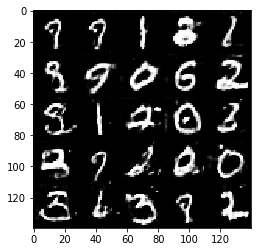

Epoch 2/2... Discriminator Loss: 0.3355... Generator Loss: 1.8674
Epoch 2/2... Discriminator Loss: 0.8140... Generator Loss: 0.8936
Epoch 2/2... Discriminator Loss: 0.7883... Generator Loss: 0.8563
Epoch 2/2... Discriminator Loss: 1.4766... Generator Loss: 3.7012
Epoch 2/2... Discriminator Loss: 0.5654... Generator Loss: 2.6224
Epoch 2/2... Discriminator Loss: 0.5029... Generator Loss: 2.4148
Epoch 2/2... Discriminator Loss: 1.0533... Generator Loss: 3.9325
Epoch 2/2... Discriminator Loss: 0.4072... Generator Loss: 2.1112
Epoch 2/2... Discriminator Loss: 0.7807... Generator Loss: 0.9778
Epoch 2/2... Discriminator Loss: 0.5454... Generator Loss: 1.4737


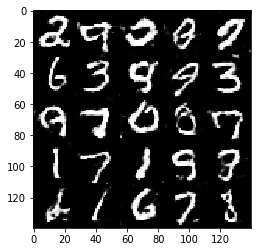

Epoch 2/2... Discriminator Loss: 0.2498... Generator Loss: 2.5387
Epoch 2/2... Discriminator Loss: 0.2450... Generator Loss: 4.7874
Epoch 2/2... Discriminator Loss: 0.9725... Generator Loss: 0.7561
Epoch 2/2... Discriminator Loss: 0.8170... Generator Loss: 4.5335
Epoch 2/2... Discriminator Loss: 0.6807... Generator Loss: 2.7749
Epoch 2/2... Discriminator Loss: 0.8318... Generator Loss: 0.8945
Epoch 2/2... Discriminator Loss: 0.6361... Generator Loss: 4.9280


In [12]:
batch_size = 64
z_dim = 7
learning_rate = 0.01
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Discriminator Loss: 0.4642... Generator Loss: 1.3049
Epoch 1/2... Discriminator Loss: 0.3714... Generator Loss: 1.6264
Epoch 1/2... Discriminator Loss: 0.2662... Generator Loss: 1.8777
Epoch 1/2... Discriminator Loss: 0.1953... Generator Loss: 2.1922
Epoch 1/2... Discriminator Loss: 0.1784... Generator Loss: 2.3239
Epoch 1/2... Discriminator Loss: 0.1372... Generator Loss: 2.5957
Epoch 1/2... Discriminator Loss: 0.1414... Generator Loss: 2.7007
Epoch 1/2... Discriminator Loss: 0.4593... Generator Loss: 1.2435
Epoch 1/2... Discriminator Loss: 0.1622... Generator Loss: 2.4277
Epoch 1/2... Discriminator Loss: 0.4014... Generator Loss: 2.1591


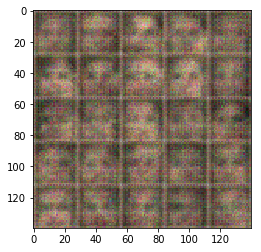

Epoch 1/2... Discriminator Loss: 0.3759... Generator Loss: 1.7078
Epoch 1/2... Discriminator Loss: 0.3030... Generator Loss: 2.6757
Epoch 1/2... Discriminator Loss: 1.1821... Generator Loss: 0.4875
Epoch 1/2... Discriminator Loss: 0.3719... Generator Loss: 2.5630
Epoch 1/2... Discriminator Loss: 0.4105... Generator Loss: 1.8055
Epoch 1/2... Discriminator Loss: 0.4128... Generator Loss: 1.7948
Epoch 1/2... Discriminator Loss: 0.7385... Generator Loss: 0.8136
Epoch 1/2... Discriminator Loss: 0.4858... Generator Loss: 2.4182
Epoch 1/2... Discriminator Loss: 0.5486... Generator Loss: 1.6536
Epoch 1/2... Discriminator Loss: 0.4286... Generator Loss: 1.7994


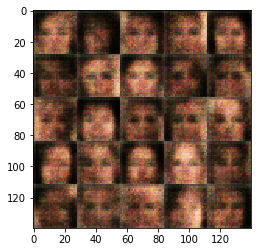

Epoch 1/2... Discriminator Loss: 0.4185... Generator Loss: 2.9161
Epoch 1/2... Discriminator Loss: 0.3979... Generator Loss: 1.6141
Epoch 1/2... Discriminator Loss: 0.4873... Generator Loss: 1.3309
Epoch 1/2... Discriminator Loss: 0.6343... Generator Loss: 0.9890
Epoch 1/2... Discriminator Loss: 1.0000... Generator Loss: 3.9374
Epoch 1/2... Discriminator Loss: 0.3839... Generator Loss: 1.8655
Epoch 1/2... Discriminator Loss: 0.5240... Generator Loss: 2.0401
Epoch 1/2... Discriminator Loss: 0.7193... Generator Loss: 1.1082
Epoch 1/2... Discriminator Loss: 0.5001... Generator Loss: 1.5554
Epoch 1/2... Discriminator Loss: 0.7746... Generator Loss: 1.1451


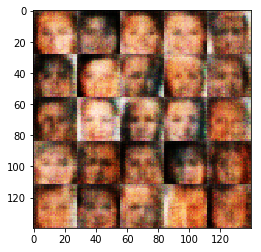

Epoch 1/2... Discriminator Loss: 0.6905... Generator Loss: 2.0255
Epoch 1/2... Discriminator Loss: 0.5670... Generator Loss: 2.7229
Epoch 1/2... Discriminator Loss: 0.9198... Generator Loss: 0.7116
Epoch 1/2... Discriminator Loss: 0.7053... Generator Loss: 1.7317
Epoch 1/2... Discriminator Loss: 0.4468... Generator Loss: 1.5478
Epoch 1/2... Discriminator Loss: 0.4470... Generator Loss: 1.6673
Epoch 1/2... Discriminator Loss: 0.5519... Generator Loss: 1.5175
Epoch 1/2... Discriminator Loss: 0.4925... Generator Loss: 1.2890
Epoch 1/2... Discriminator Loss: 0.4792... Generator Loss: 1.4275
Epoch 1/2... Discriminator Loss: 0.5364... Generator Loss: 1.8645


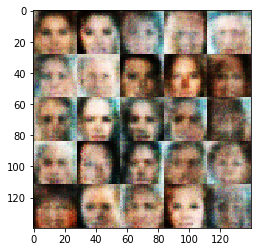

Epoch 1/2... Discriminator Loss: 0.7717... Generator Loss: 0.8243
Epoch 1/2... Discriminator Loss: 0.5325... Generator Loss: 2.2589
Epoch 1/2... Discriminator Loss: 0.7051... Generator Loss: 0.9383
Epoch 1/2... Discriminator Loss: 0.6992... Generator Loss: 1.1663
Epoch 1/2... Discriminator Loss: 0.6791... Generator Loss: 1.0422
Epoch 1/2... Discriminator Loss: 0.6276... Generator Loss: 1.0775
Epoch 1/2... Discriminator Loss: 0.4532... Generator Loss: 1.3862
Epoch 1/2... Discriminator Loss: 0.8020... Generator Loss: 1.1729
Epoch 1/2... Discriminator Loss: 0.6808... Generator Loss: 0.9751
Epoch 1/2... Discriminator Loss: 0.4889... Generator Loss: 1.5036


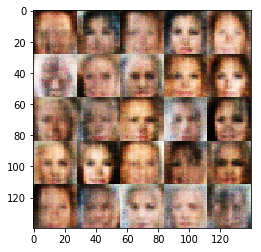

Epoch 1/2... Discriminator Loss: 0.7766... Generator Loss: 0.9930
Epoch 1/2... Discriminator Loss: 0.5533... Generator Loss: 2.8007
Epoch 1/2... Discriminator Loss: 1.2366... Generator Loss: 0.6021
Epoch 1/2... Discriminator Loss: 0.4047... Generator Loss: 1.6947
Epoch 1/2... Discriminator Loss: 0.3939... Generator Loss: 1.6649
Epoch 1/2... Discriminator Loss: 0.5444... Generator Loss: 1.5638
Epoch 1/2... Discriminator Loss: 0.6201... Generator Loss: 1.0643
Epoch 1/2... Discriminator Loss: 0.4493... Generator Loss: 1.6445
Epoch 1/2... Discriminator Loss: 0.6393... Generator Loss: 1.2377
Epoch 1/2... Discriminator Loss: 0.4165... Generator Loss: 1.4849


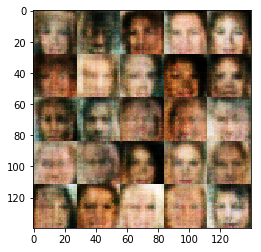

Epoch 1/2... Discriminator Loss: 0.2762... Generator Loss: 1.9800
Epoch 1/2... Discriminator Loss: 0.4716... Generator Loss: 1.9684
Epoch 1/2... Discriminator Loss: 0.7919... Generator Loss: 0.9609
Epoch 1/2... Discriminator Loss: 0.5686... Generator Loss: 1.3257
Epoch 1/2... Discriminator Loss: 0.5093... Generator Loss: 1.2798
Epoch 1/2... Discriminator Loss: 0.8012... Generator Loss: 1.3422
Epoch 1/2... Discriminator Loss: 0.4370... Generator Loss: 1.6306
Epoch 1/2... Discriminator Loss: 0.5672... Generator Loss: 2.1836
Epoch 1/2... Discriminator Loss: 0.6092... Generator Loss: 1.2511
Epoch 1/2... Discriminator Loss: 1.3513... Generator Loss: 2.6121


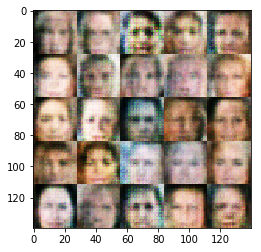

Epoch 1/2... Discriminator Loss: 0.6577... Generator Loss: 1.1670
Epoch 1/2... Discriminator Loss: 0.5219... Generator Loss: 2.0403
Epoch 1/2... Discriminator Loss: 0.4115... Generator Loss: 2.0826
Epoch 1/2... Discriminator Loss: 0.5094... Generator Loss: 2.0680
Epoch 1/2... Discriminator Loss: 0.9114... Generator Loss: 0.7850
Epoch 1/2... Discriminator Loss: 0.8301... Generator Loss: 0.8555
Epoch 1/2... Discriminator Loss: 0.4911... Generator Loss: 1.1853
Epoch 1/2... Discriminator Loss: 0.6696... Generator Loss: 1.0301
Epoch 1/2... Discriminator Loss: 0.7846... Generator Loss: 0.9304
Epoch 1/2... Discriminator Loss: 0.6062... Generator Loss: 1.7593


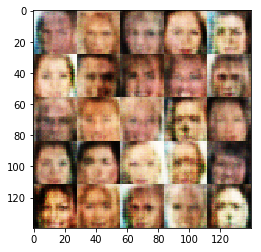

Epoch 1/2... Discriminator Loss: 1.0703... Generator Loss: 0.7160
Epoch 1/2... Discriminator Loss: 0.5659... Generator Loss: 2.0129
Epoch 1/2... Discriminator Loss: 0.6489... Generator Loss: 1.1673
Epoch 1/2... Discriminator Loss: 0.4739... Generator Loss: 1.6216
Epoch 1/2... Discriminator Loss: 0.8802... Generator Loss: 0.7162
Epoch 1/2... Discriminator Loss: 0.7046... Generator Loss: 1.1890
Epoch 1/2... Discriminator Loss: 0.8116... Generator Loss: 1.2008
Epoch 1/2... Discriminator Loss: 1.1392... Generator Loss: 0.5838
Epoch 1/2... Discriminator Loss: 0.5696... Generator Loss: 1.1159
Epoch 1/2... Discriminator Loss: 0.9466... Generator Loss: 0.7034


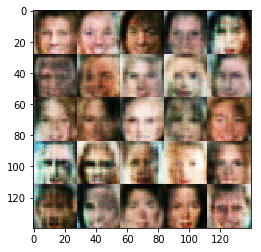

Epoch 1/2... Discriminator Loss: 0.9906... Generator Loss: 0.6875
Epoch 1/2... Discriminator Loss: 0.6633... Generator Loss: 1.6449
Epoch 1/2... Discriminator Loss: 1.2096... Generator Loss: 0.6086
Epoch 1/2... Discriminator Loss: 1.0448... Generator Loss: 0.6336
Epoch 1/2... Discriminator Loss: 0.8623... Generator Loss: 1.0364
Epoch 1/2... Discriminator Loss: 0.8081... Generator Loss: 1.1098
Epoch 1/2... Discriminator Loss: 0.7819... Generator Loss: 1.2492
Epoch 1/2... Discriminator Loss: 0.7054... Generator Loss: 1.9336
Epoch 1/2... Discriminator Loss: 0.4768... Generator Loss: 1.8153
Epoch 1/2... Discriminator Loss: 0.5899... Generator Loss: 1.9397


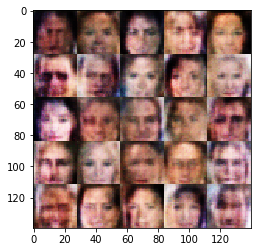

Epoch 1/2... Discriminator Loss: 0.6296... Generator Loss: 1.5506
Epoch 1/2... Discriminator Loss: 0.8256... Generator Loss: 0.9440
Epoch 1/2... Discriminator Loss: 0.9419... Generator Loss: 0.6866
Epoch 1/2... Discriminator Loss: 0.7931... Generator Loss: 0.8229
Epoch 1/2... Discriminator Loss: 0.7547... Generator Loss: 1.9380
Epoch 1/2... Discriminator Loss: 0.7370... Generator Loss: 1.0569
Epoch 1/2... Discriminator Loss: 1.3673... Generator Loss: 1.2614
Epoch 1/2... Discriminator Loss: 0.8279... Generator Loss: 0.8447
Epoch 1/2... Discriminator Loss: 0.9806... Generator Loss: 1.0307
Epoch 1/2... Discriminator Loss: 0.9031... Generator Loss: 0.8991


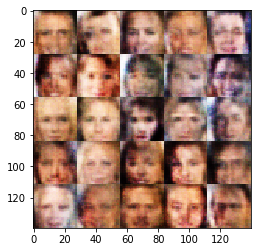

Epoch 1/2... Discriminator Loss: 1.1179... Generator Loss: 0.5764
Epoch 1/2... Discriminator Loss: 0.9342... Generator Loss: 0.7400
Epoch 1/2... Discriminator Loss: 0.9176... Generator Loss: 0.7388
Epoch 1/2... Discriminator Loss: 0.7648... Generator Loss: 0.9367
Epoch 1/2... Discriminator Loss: 0.9133... Generator Loss: 0.7281
Epoch 1/2... Discriminator Loss: 0.7369... Generator Loss: 1.3494
Epoch 1/2... Discriminator Loss: 0.7295... Generator Loss: 0.9851
Epoch 1/2... Discriminator Loss: 0.6432... Generator Loss: 1.9033
Epoch 1/2... Discriminator Loss: 0.9380... Generator Loss: 0.7896
Epoch 1/2... Discriminator Loss: 0.9888... Generator Loss: 1.1872


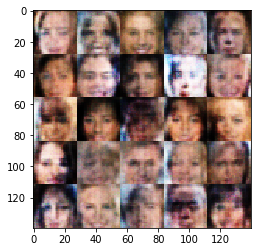

Epoch 1/2... Discriminator Loss: 0.5328... Generator Loss: 1.5252
Epoch 1/2... Discriminator Loss: 0.7393... Generator Loss: 1.4930
Epoch 1/2... Discriminator Loss: 0.9870... Generator Loss: 0.6904
Epoch 1/2... Discriminator Loss: 0.6498... Generator Loss: 2.1341
Epoch 1/2... Discriminator Loss: 0.8395... Generator Loss: 1.1178
Epoch 1/2... Discriminator Loss: 0.7027... Generator Loss: 1.2962
Epoch 1/2... Discriminator Loss: 0.8365... Generator Loss: 0.8719
Epoch 1/2... Discriminator Loss: 0.8097... Generator Loss: 1.1506
Epoch 1/2... Discriminator Loss: 0.7686... Generator Loss: 1.0010
Epoch 1/2... Discriminator Loss: 0.8713... Generator Loss: 0.8641


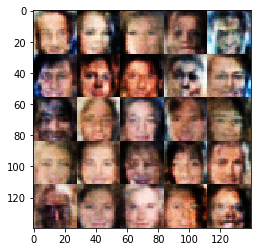

Epoch 1/2... Discriminator Loss: 0.6962... Generator Loss: 1.2952
Epoch 1/2... Discriminator Loss: 0.7237... Generator Loss: 1.2761
Epoch 1/2... Discriminator Loss: 0.7846... Generator Loss: 0.9201
Epoch 1/2... Discriminator Loss: 0.9729... Generator Loss: 0.6132
Epoch 1/2... Discriminator Loss: 0.8293... Generator Loss: 1.4878
Epoch 1/2... Discriminator Loss: 0.7216... Generator Loss: 1.1846
Epoch 1/2... Discriminator Loss: 0.6679... Generator Loss: 1.6767
Epoch 1/2... Discriminator Loss: 0.7630... Generator Loss: 1.0606
Epoch 1/2... Discriminator Loss: 1.0726... Generator Loss: 0.5922
Epoch 1/2... Discriminator Loss: 1.0285... Generator Loss: 0.6126


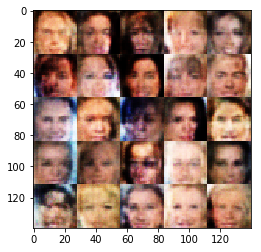

Epoch 1/2... Discriminator Loss: 0.8285... Generator Loss: 1.1133
Epoch 1/2... Discriminator Loss: 0.7410... Generator Loss: 1.0144
Epoch 1/2... Discriminator Loss: 0.8037... Generator Loss: 0.7796
Epoch 1/2... Discriminator Loss: 0.7407... Generator Loss: 1.5559
Epoch 1/2... Discriminator Loss: 0.5169... Generator Loss: 1.3066
Epoch 1/2... Discriminator Loss: 0.8260... Generator Loss: 0.8753
Epoch 1/2... Discriminator Loss: 0.7142... Generator Loss: 1.0959
Epoch 1/2... Discriminator Loss: 0.8896... Generator Loss: 0.7071
Epoch 1/2... Discriminator Loss: 0.9333... Generator Loss: 0.9985
Epoch 1/2... Discriminator Loss: 0.7483... Generator Loss: 1.0275


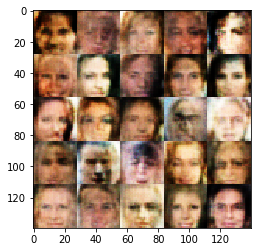

Epoch 1/2... Discriminator Loss: 0.8994... Generator Loss: 1.0027
Epoch 1/2... Discriminator Loss: 0.7522... Generator Loss: 0.9605
Epoch 1/2... Discriminator Loss: 0.8576... Generator Loss: 0.7497
Epoch 1/2... Discriminator Loss: 0.6068... Generator Loss: 1.5410
Epoch 1/2... Discriminator Loss: 0.7755... Generator Loss: 1.1709
Epoch 1/2... Discriminator Loss: 0.5762... Generator Loss: 1.2930
Epoch 1/2... Discriminator Loss: 0.8306... Generator Loss: 0.8718
Epoch 1/2... Discriminator Loss: 0.8546... Generator Loss: 0.7630
Epoch 1/2... Discriminator Loss: 0.9190... Generator Loss: 0.9715
Epoch 1/2... Discriminator Loss: 0.7253... Generator Loss: 1.1934


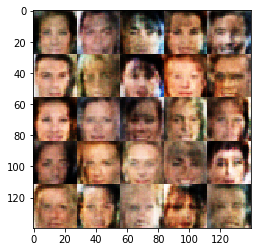

Epoch 1/2... Discriminator Loss: 1.1580... Generator Loss: 0.4646
Epoch 1/2... Discriminator Loss: 0.6813... Generator Loss: 1.0846
Epoch 1/2... Discriminator Loss: 0.6962... Generator Loss: 1.2029
Epoch 1/2... Discriminator Loss: 0.7952... Generator Loss: 0.9371
Epoch 1/2... Discriminator Loss: 0.7748... Generator Loss: 1.0025
Epoch 1/2... Discriminator Loss: 0.8500... Generator Loss: 0.8699
Epoch 1/2... Discriminator Loss: 0.7608... Generator Loss: 0.8957
Epoch 1/2... Discriminator Loss: 0.7445... Generator Loss: 1.2167
Epoch 1/2... Discriminator Loss: 0.5835... Generator Loss: 1.1771
Epoch 1/2... Discriminator Loss: 0.6395... Generator Loss: 1.2720


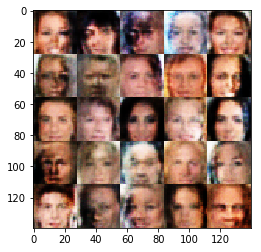

Epoch 1/2... Discriminator Loss: 0.7443... Generator Loss: 0.9050
Epoch 1/2... Discriminator Loss: 0.7208... Generator Loss: 1.1479
Epoch 1/2... Discriminator Loss: 0.5290... Generator Loss: 1.5795
Epoch 1/2... Discriminator Loss: 0.8758... Generator Loss: 2.0047
Epoch 1/2... Discriminator Loss: 0.6475... Generator Loss: 1.2242
Epoch 1/2... Discriminator Loss: 0.8110... Generator Loss: 1.0404
Epoch 1/2... Discriminator Loss: 0.8210... Generator Loss: 1.0793
Epoch 1/2... Discriminator Loss: 0.5128... Generator Loss: 1.7263
Epoch 1/2... Discriminator Loss: 0.6996... Generator Loss: 1.3210
Epoch 1/2... Discriminator Loss: 0.5697... Generator Loss: 1.4089


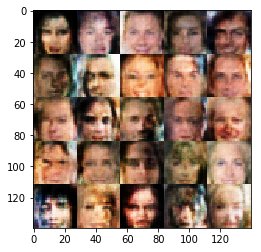

Epoch 1/2... Discriminator Loss: 0.7251... Generator Loss: 1.3180
Epoch 1/2... Discriminator Loss: 0.6525... Generator Loss: 1.0451
Epoch 1/2... Discriminator Loss: 0.6965... Generator Loss: 1.2924
Epoch 1/2... Discriminator Loss: 1.0030... Generator Loss: 0.7814
Epoch 1/2... Discriminator Loss: 0.6393... Generator Loss: 1.3044
Epoch 1/2... Discriminator Loss: 0.7214... Generator Loss: 1.2956
Epoch 1/2... Discriminator Loss: 0.9788... Generator Loss: 0.6562
Epoch 1/2... Discriminator Loss: 0.4451... Generator Loss: 1.7234
Epoch 1/2... Discriminator Loss: 0.7845... Generator Loss: 1.0749
Epoch 1/2... Discriminator Loss: 0.7121... Generator Loss: 1.2112


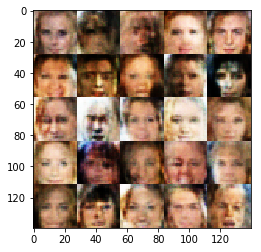

Epoch 1/2... Discriminator Loss: 0.8190... Generator Loss: 1.2074
Epoch 1/2... Discriminator Loss: 0.4618... Generator Loss: 1.3871
Epoch 1/2... Discriminator Loss: 0.7841... Generator Loss: 2.3224
Epoch 1/2... Discriminator Loss: 0.5217... Generator Loss: 1.4186
Epoch 1/2... Discriminator Loss: 0.5830... Generator Loss: 1.5467
Epoch 1/2... Discriminator Loss: 0.5521... Generator Loss: 1.4049
Epoch 1/2... Discriminator Loss: 1.0028... Generator Loss: 0.6110
Epoch 1/2... Discriminator Loss: 0.6813... Generator Loss: 1.0567
Epoch 1/2... Discriminator Loss: 0.4079... Generator Loss: 1.4049
Epoch 1/2... Discriminator Loss: 0.6860... Generator Loss: 0.9525


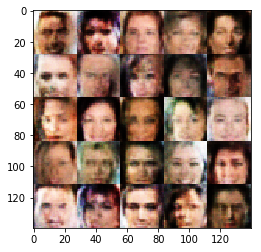

Epoch 1/2... Discriminator Loss: 0.4930... Generator Loss: 1.7515
Epoch 1/2... Discriminator Loss: 0.7000... Generator Loss: 1.1235
Epoch 1/2... Discriminator Loss: 0.5675... Generator Loss: 1.3563
Epoch 1/2... Discriminator Loss: 0.7838... Generator Loss: 0.9433
Epoch 1/2... Discriminator Loss: 0.6382... Generator Loss: 1.2308
Epoch 1/2... Discriminator Loss: 0.7910... Generator Loss: 1.0900
Epoch 1/2... Discriminator Loss: 0.7527... Generator Loss: 1.0936
Epoch 1/2... Discriminator Loss: 0.6860... Generator Loss: 0.9795
Epoch 1/2... Discriminator Loss: 0.7680... Generator Loss: 0.8666
Epoch 1/2... Discriminator Loss: 0.4605... Generator Loss: 1.9886


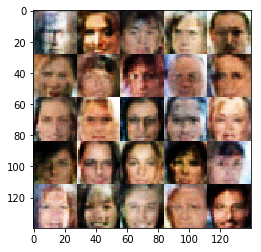

Epoch 1/2... Discriminator Loss: 0.8097... Generator Loss: 0.8967
Epoch 1/2... Discriminator Loss: 0.8542... Generator Loss: 0.8338
Epoch 1/2... Discriminator Loss: 0.5083... Generator Loss: 1.3741
Epoch 1/2... Discriminator Loss: 0.6532... Generator Loss: 1.1517
Epoch 1/2... Discriminator Loss: 0.8608... Generator Loss: 0.8149
Epoch 1/2... Discriminator Loss: 0.9679... Generator Loss: 1.0164
Epoch 1/2... Discriminator Loss: 0.5283... Generator Loss: 1.3842
Epoch 1/2... Discriminator Loss: 1.2984... Generator Loss: 0.4375
Epoch 1/2... Discriminator Loss: 0.7064... Generator Loss: 0.9562
Epoch 1/2... Discriminator Loss: 0.9904... Generator Loss: 0.6021


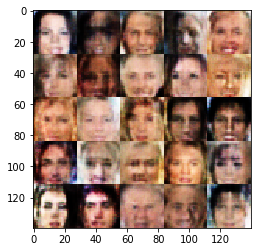

Epoch 1/2... Discriminator Loss: 1.1883... Generator Loss: 0.5324
Epoch 1/2... Discriminator Loss: 0.7731... Generator Loss: 1.4777
Epoch 1/2... Discriminator Loss: 0.5677... Generator Loss: 1.5913
Epoch 1/2... Discriminator Loss: 1.4086... Generator Loss: 0.3693
Epoch 1/2... Discriminator Loss: 0.5048... Generator Loss: 1.6864
Epoch 1/2... Discriminator Loss: 0.7714... Generator Loss: 1.0748
Epoch 1/2... Discriminator Loss: 0.5592... Generator Loss: 1.3109
Epoch 1/2... Discriminator Loss: 0.6206... Generator Loss: 1.3223
Epoch 1/2... Discriminator Loss: 0.9221... Generator Loss: 1.0127
Epoch 1/2... Discriminator Loss: 0.3490... Generator Loss: 1.9461


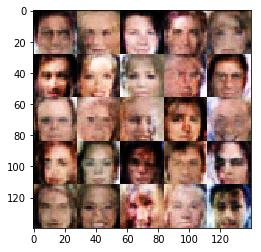

Epoch 1/2... Discriminator Loss: 1.2008... Generator Loss: 0.5174
Epoch 1/2... Discriminator Loss: 0.6205... Generator Loss: 1.3639
Epoch 1/2... Discriminator Loss: 0.5704... Generator Loss: 1.2041
Epoch 1/2... Discriminator Loss: 0.6449... Generator Loss: 1.1132
Epoch 1/2... Discriminator Loss: 0.3987... Generator Loss: 1.6653
Epoch 1/2... Discriminator Loss: 0.3936... Generator Loss: 1.4393
Epoch 1/2... Discriminator Loss: 1.0378... Generator Loss: 0.6547
Epoch 1/2... Discriminator Loss: 0.9901... Generator Loss: 0.6949
Epoch 1/2... Discriminator Loss: 0.8930... Generator Loss: 0.8538
Epoch 1/2... Discriminator Loss: 0.6575... Generator Loss: 0.9922


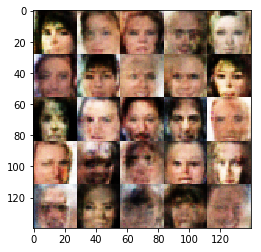

Epoch 1/2... Discriminator Loss: 0.9556... Generator Loss: 0.6982
Epoch 1/2... Discriminator Loss: 0.6321... Generator Loss: 1.3120
Epoch 1/2... Discriminator Loss: 1.1961... Generator Loss: 0.4837
Epoch 1/2... Discriminator Loss: 0.5139... Generator Loss: 1.3745
Epoch 1/2... Discriminator Loss: 0.8375... Generator Loss: 0.9925
Epoch 1/2... Discriminator Loss: 0.7735... Generator Loss: 1.2855
Epoch 1/2... Discriminator Loss: 1.0892... Generator Loss: 0.5916
Epoch 1/2... Discriminator Loss: 0.8624... Generator Loss: 0.7827
Epoch 1/2... Discriminator Loss: 0.4911... Generator Loss: 1.4843
Epoch 1/2... Discriminator Loss: 0.4427... Generator Loss: 1.5777


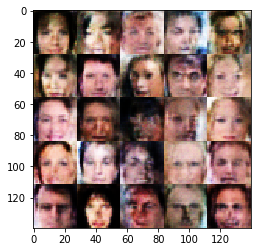

Epoch 1/2... Discriminator Loss: 0.8767... Generator Loss: 0.6903
Epoch 1/2... Discriminator Loss: 0.6990... Generator Loss: 1.0653
Epoch 1/2... Discriminator Loss: 0.6650... Generator Loss: 1.2761
Epoch 1/2... Discriminator Loss: 0.5859... Generator Loss: 1.2518
Epoch 1/2... Discriminator Loss: 0.6268... Generator Loss: 0.9963
Epoch 1/2... Discriminator Loss: 1.0365... Generator Loss: 0.6001
Epoch 1/2... Discriminator Loss: 0.3240... Generator Loss: 1.8444
Epoch 1/2... Discriminator Loss: 0.6067... Generator Loss: 1.0631
Epoch 1/2... Discriminator Loss: 0.8854... Generator Loss: 1.1195
Epoch 1/2... Discriminator Loss: 0.7284... Generator Loss: 0.9619


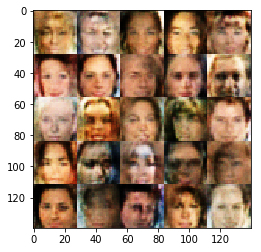

Epoch 1/2... Discriminator Loss: 1.0090... Generator Loss: 0.6367
Epoch 1/2... Discriminator Loss: 1.1026... Generator Loss: 0.7542
Epoch 1/2... Discriminator Loss: 0.4779... Generator Loss: 1.4322
Epoch 1/2... Discriminator Loss: 0.6001... Generator Loss: 1.5647
Epoch 1/2... Discriminator Loss: 0.6281... Generator Loss: 1.1358
Epoch 1/2... Discriminator Loss: 0.8552... Generator Loss: 0.9139
Epoch 1/2... Discriminator Loss: 0.5033... Generator Loss: 1.3907
Epoch 1/2... Discriminator Loss: 0.9039... Generator Loss: 0.8871
Epoch 1/2... Discriminator Loss: 0.7793... Generator Loss: 0.9882
Epoch 1/2... Discriminator Loss: 0.6472... Generator Loss: 1.0123


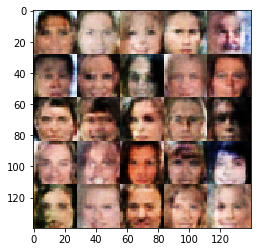

Epoch 1/2... Discriminator Loss: 1.1581... Generator Loss: 0.5432
Epoch 1/2... Discriminator Loss: 0.5369... Generator Loss: 1.7480
Epoch 1/2... Discriminator Loss: 0.6441... Generator Loss: 1.2238
Epoch 1/2... Discriminator Loss: 0.5843... Generator Loss: 1.2544
Epoch 1/2... Discriminator Loss: 0.8444... Generator Loss: 0.7718
Epoch 1/2... Discriminator Loss: 0.8916... Generator Loss: 0.6859
Epoch 1/2... Discriminator Loss: 0.6144... Generator Loss: 1.1601
Epoch 1/2... Discriminator Loss: 0.6079... Generator Loss: 1.2782
Epoch 1/2... Discriminator Loss: 0.7356... Generator Loss: 0.8891
Epoch 1/2... Discriminator Loss: 0.6616... Generator Loss: 1.6668


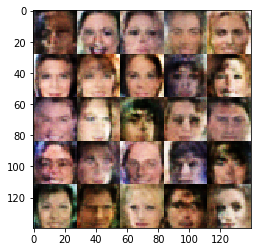

Epoch 1/2... Discriminator Loss: 0.6646... Generator Loss: 1.1506
Epoch 1/2... Discriminator Loss: 0.6009... Generator Loss: 1.2926
Epoch 1/2... Discriminator Loss: 0.7649... Generator Loss: 1.0279
Epoch 1/2... Discriminator Loss: 0.8516... Generator Loss: 1.0138
Epoch 1/2... Discriminator Loss: 0.6929... Generator Loss: 1.0680
Epoch 1/2... Discriminator Loss: 0.7099... Generator Loss: 1.1195
Epoch 1/2... Discriminator Loss: 0.5841... Generator Loss: 1.1854
Epoch 1/2... Discriminator Loss: 1.0121... Generator Loss: 0.6054
Epoch 1/2... Discriminator Loss: 0.3862... Generator Loss: 1.9430
Epoch 1/2... Discriminator Loss: 0.4484... Generator Loss: 1.5154


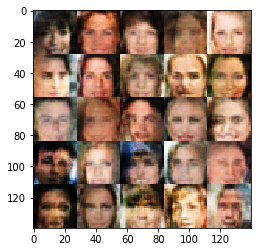

Epoch 1/2... Discriminator Loss: 0.7861... Generator Loss: 0.9608
Epoch 1/2... Discriminator Loss: 0.7118... Generator Loss: 1.0786
Epoch 1/2... Discriminator Loss: 0.6145... Generator Loss: 1.0180
Epoch 1/2... Discriminator Loss: 0.6597... Generator Loss: 1.2683
Epoch 1/2... Discriminator Loss: 0.8433... Generator Loss: 0.8144
Epoch 1/2... Discriminator Loss: 1.4384... Generator Loss: 0.3887
Epoch 1/2... Discriminator Loss: 0.7134... Generator Loss: 1.0163
Epoch 1/2... Discriminator Loss: 0.2598... Generator Loss: 1.9278
Epoch 1/2... Discriminator Loss: 0.7997... Generator Loss: 0.9927
Epoch 1/2... Discriminator Loss: 0.6266... Generator Loss: 1.0540


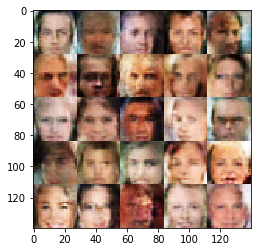

Epoch 1/2... Discriminator Loss: 0.5533... Generator Loss: 1.3431
Epoch 1/2... Discriminator Loss: 0.7366... Generator Loss: 0.8595
Epoch 1/2... Discriminator Loss: 0.5283... Generator Loss: 1.3059
Epoch 1/2... Discriminator Loss: 0.9011... Generator Loss: 0.7176
Epoch 1/2... Discriminator Loss: 0.7033... Generator Loss: 1.0005
Epoch 1/2... Discriminator Loss: 1.0649... Generator Loss: 0.7430
Epoch 1/2... Discriminator Loss: 0.4770... Generator Loss: 1.6125
Epoch 1/2... Discriminator Loss: 0.6631... Generator Loss: 1.0744
Epoch 1/2... Discriminator Loss: 0.6486... Generator Loss: 1.4746
Epoch 1/2... Discriminator Loss: 0.4504... Generator Loss: 1.4153


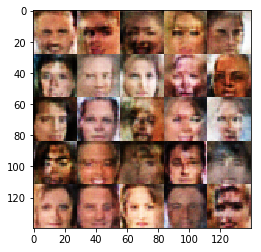

Epoch 1/2... Discriminator Loss: 0.5295... Generator Loss: 1.9504
Epoch 1/2... Discriminator Loss: 0.6312... Generator Loss: 1.1530
Epoch 1/2... Discriminator Loss: 0.5721... Generator Loss: 1.4386
Epoch 1/2... Discriminator Loss: 0.6902... Generator Loss: 1.1124
Epoch 1/2... Discriminator Loss: 0.5536... Generator Loss: 1.2565
Epoch 1/2... Discriminator Loss: 0.9129... Generator Loss: 0.9765
Epoch 1/2... Discriminator Loss: 1.0451... Generator Loss: 0.7845
Epoch 1/2... Discriminator Loss: 1.0658... Generator Loss: 0.5474
Epoch 1/2... Discriminator Loss: 0.8286... Generator Loss: 0.8312
Epoch 1/2... Discriminator Loss: 0.6050... Generator Loss: 1.9366


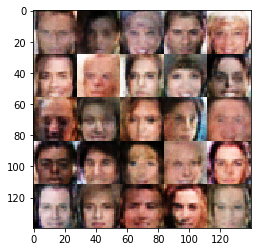

Epoch 1/2... Discriminator Loss: 0.9012... Generator Loss: 0.7154
Epoch 1/2... Discriminator Loss: 0.8452... Generator Loss: 0.8281
Epoch 1/2... Discriminator Loss: 1.0709... Generator Loss: 0.5937
Epoch 1/2... Discriminator Loss: 1.0256... Generator Loss: 0.5635
Epoch 1/2... Discriminator Loss: 1.5347... Generator Loss: 0.3517
Epoch 1/2... Discriminator Loss: 0.7374... Generator Loss: 0.9349
Epoch 1/2... Discriminator Loss: 0.5148... Generator Loss: 1.5263
Epoch 1/2... Discriminator Loss: 0.7375... Generator Loss: 1.0419
Epoch 1/2... Discriminator Loss: 1.0076... Generator Loss: 0.5712
Epoch 1/2... Discriminator Loss: 0.5426... Generator Loss: 1.3403


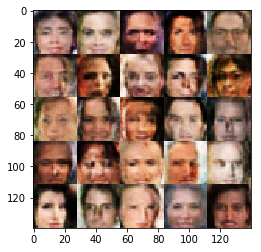

Epoch 1/2... Discriminator Loss: 0.9460... Generator Loss: 0.8406
Epoch 1/2... Discriminator Loss: 0.4444... Generator Loss: 1.4563
Epoch 1/2... Discriminator Loss: 0.6169... Generator Loss: 1.5328
Epoch 1/2... Discriminator Loss: 0.4766... Generator Loss: 1.3945
Epoch 1/2... Discriminator Loss: 0.7663... Generator Loss: 1.0112
Epoch 1/2... Discriminator Loss: 0.5988... Generator Loss: 1.4110
Epoch 1/2... Discriminator Loss: 0.6812... Generator Loss: 1.1377
Epoch 1/2... Discriminator Loss: 0.5157... Generator Loss: 1.4495
Epoch 1/2... Discriminator Loss: 0.8069... Generator Loss: 0.9000
Epoch 1/2... Discriminator Loss: 0.7214... Generator Loss: 0.9080


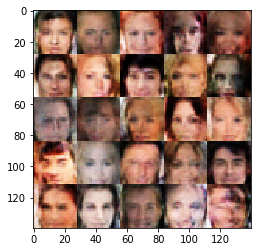

Epoch 1/2... Discriminator Loss: 0.5263... Generator Loss: 1.4357
Epoch 1/2... Discriminator Loss: 0.6314... Generator Loss: 1.6110
Epoch 1/2... Discriminator Loss: 1.3928... Generator Loss: 0.3880
Epoch 1/2... Discriminator Loss: 0.8736... Generator Loss: 0.7759
Epoch 1/2... Discriminator Loss: 0.9713... Generator Loss: 0.6158
Epoch 1/2... Discriminator Loss: 0.5102... Generator Loss: 1.6229
Epoch 1/2... Discriminator Loss: 0.6319... Generator Loss: 1.1411
Epoch 1/2... Discriminator Loss: 0.4168... Generator Loss: 1.5190
Epoch 1/2... Discriminator Loss: 0.8857... Generator Loss: 0.7442
Epoch 1/2... Discriminator Loss: 0.9519... Generator Loss: 1.0949


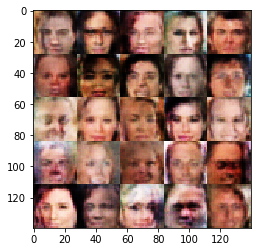

Epoch 1/2... Discriminator Loss: 0.4941... Generator Loss: 1.4603
Epoch 1/2... Discriminator Loss: 0.7912... Generator Loss: 1.0159
Epoch 1/2... Discriminator Loss: 0.6168... Generator Loss: 1.2585
Epoch 1/2... Discriminator Loss: 0.8380... Generator Loss: 0.7266
Epoch 1/2... Discriminator Loss: 0.4759... Generator Loss: 1.5547
Epoch 1/2... Discriminator Loss: 0.4166... Generator Loss: 1.3924
Epoch 1/2... Discriminator Loss: 1.0193... Generator Loss: 0.6960
Epoch 1/2... Discriminator Loss: 0.7052... Generator Loss: 1.1570
Epoch 1/2... Discriminator Loss: 0.9335... Generator Loss: 0.7203
Epoch 1/2... Discriminator Loss: 0.7253... Generator Loss: 0.8860


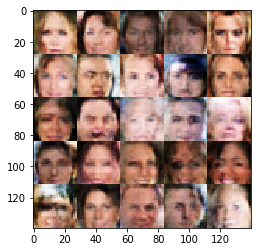

Epoch 1/2... Discriminator Loss: 0.8848... Generator Loss: 0.8019
Epoch 1/2... Discriminator Loss: 0.8105... Generator Loss: 0.8380
Epoch 1/2... Discriminator Loss: 0.4387... Generator Loss: 1.5315
Epoch 1/2... Discriminator Loss: 0.4218... Generator Loss: 1.4866
Epoch 1/2... Discriminator Loss: 0.6160... Generator Loss: 1.1579
Epoch 1/2... Discriminator Loss: 0.7010... Generator Loss: 1.1734
Epoch 1/2... Discriminator Loss: 0.6941... Generator Loss: 1.4705
Epoch 1/2... Discriminator Loss: 0.6926... Generator Loss: 1.0579
Epoch 1/2... Discriminator Loss: 0.6361... Generator Loss: 1.1353
Epoch 1/2... Discriminator Loss: 0.5375... Generator Loss: 1.3745


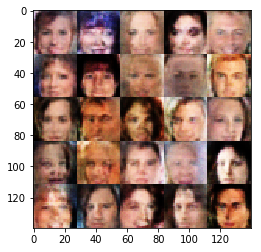

Epoch 1/2... Discriminator Loss: 0.5285... Generator Loss: 1.3258
Epoch 1/2... Discriminator Loss: 0.7971... Generator Loss: 1.5816
Epoch 1/2... Discriminator Loss: 0.4952... Generator Loss: 1.7344
Epoch 1/2... Discriminator Loss: 1.1250... Generator Loss: 0.5331
Epoch 1/2... Discriminator Loss: 0.6525... Generator Loss: 1.5053
Epoch 1/2... Discriminator Loss: 0.9633... Generator Loss: 0.6301
Epoch 1/2... Discriminator Loss: 0.5421... Generator Loss: 1.3900
Epoch 1/2... Discriminator Loss: 0.6510... Generator Loss: 1.3369
Epoch 1/2... Discriminator Loss: 0.8476... Generator Loss: 1.3246
Epoch 1/2... Discriminator Loss: 0.7452... Generator Loss: 0.9843


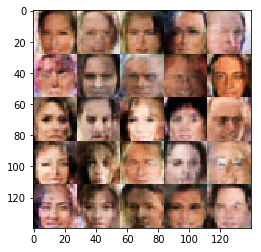

Epoch 1/2... Discriminator Loss: 0.6470... Generator Loss: 1.3489
Epoch 1/2... Discriminator Loss: 1.3616... Generator Loss: 0.3854
Epoch 1/2... Discriminator Loss: 0.6435... Generator Loss: 1.3445
Epoch 1/2... Discriminator Loss: 0.6220... Generator Loss: 1.0970
Epoch 1/2... Discriminator Loss: 0.5682... Generator Loss: 1.3290
Epoch 1/2... Discriminator Loss: 0.8189... Generator Loss: 0.8574
Epoch 1/2... Discriminator Loss: 0.9899... Generator Loss: 0.7706
Epoch 1/2... Discriminator Loss: 0.8202... Generator Loss: 0.8899
Epoch 1/2... Discriminator Loss: 0.5237... Generator Loss: 1.4451
Epoch 1/2... Discriminator Loss: 1.0552... Generator Loss: 0.6579


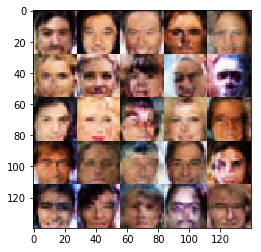

Epoch 1/2... Discriminator Loss: 0.6258... Generator Loss: 1.1044
Epoch 1/2... Discriminator Loss: 0.6000... Generator Loss: 1.1575
Epoch 1/2... Discriminator Loss: 0.7151... Generator Loss: 0.9676
Epoch 1/2... Discriminator Loss: 0.8696... Generator Loss: 0.8120
Epoch 1/2... Discriminator Loss: 0.6251... Generator Loss: 1.0426
Epoch 1/2... Discriminator Loss: 0.7538... Generator Loss: 1.0395
Epoch 1/2... Discriminator Loss: 1.0031... Generator Loss: 0.7621
Epoch 1/2... Discriminator Loss: 0.9948... Generator Loss: 0.6174
Epoch 1/2... Discriminator Loss: 0.5707... Generator Loss: 1.2372
Epoch 1/2... Discriminator Loss: 0.6950... Generator Loss: 1.1105


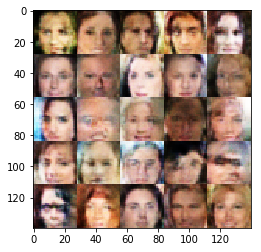

Epoch 1/2... Discriminator Loss: 0.8089... Generator Loss: 0.8577
Epoch 1/2... Discriminator Loss: 0.4696... Generator Loss: 1.7243
Epoch 1/2... Discriminator Loss: 0.7130... Generator Loss: 0.9836
Epoch 1/2... Discriminator Loss: 0.7990... Generator Loss: 0.9850
Epoch 1/2... Discriminator Loss: 0.7191... Generator Loss: 0.9983
Epoch 1/2... Discriminator Loss: 0.8880... Generator Loss: 0.7204
Epoch 1/2... Discriminator Loss: 0.5011... Generator Loss: 1.8058
Epoch 1/2... Discriminator Loss: 0.3831... Generator Loss: 2.2714
Epoch 1/2... Discriminator Loss: 0.7129... Generator Loss: 1.1422
Epoch 1/2... Discriminator Loss: 0.6237... Generator Loss: 1.2595


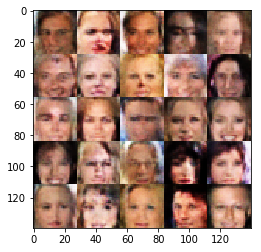

Epoch 1/2... Discriminator Loss: 0.9111... Generator Loss: 0.8766
Epoch 1/2... Discriminator Loss: 0.7063... Generator Loss: 1.1286
Epoch 1/2... Discriminator Loss: 0.3720... Generator Loss: 1.4896
Epoch 1/2... Discriminator Loss: 0.8791... Generator Loss: 0.7527
Epoch 1/2... Discriminator Loss: 0.6324... Generator Loss: 1.4044
Epoch 1/2... Discriminator Loss: 0.8825... Generator Loss: 0.6403
Epoch 1/2... Discriminator Loss: 0.5554... Generator Loss: 1.4973
Epoch 1/2... Discriminator Loss: 0.6601... Generator Loss: 0.9983
Epoch 1/2... Discriminator Loss: 0.7470... Generator Loss: 1.3589
Epoch 1/2... Discriminator Loss: 0.4157... Generator Loss: 1.8979


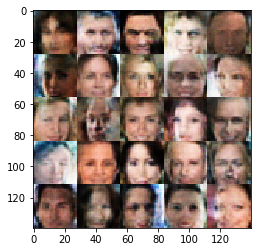

Epoch 1/2... Discriminator Loss: 0.7492... Generator Loss: 1.2134
Epoch 1/2... Discriminator Loss: 0.6699... Generator Loss: 1.7370
Epoch 1/2... Discriminator Loss: 1.1003... Generator Loss: 0.6110
Epoch 1/2... Discriminator Loss: 0.6129... Generator Loss: 1.2758
Epoch 1/2... Discriminator Loss: 0.4481... Generator Loss: 1.5683
Epoch 1/2... Discriminator Loss: 0.2992... Generator Loss: 1.7236
Epoch 1/2... Discriminator Loss: 0.9744... Generator Loss: 1.4848
Epoch 1/2... Discriminator Loss: 0.5953... Generator Loss: 1.1776
Epoch 1/2... Discriminator Loss: 0.9213... Generator Loss: 0.8298
Epoch 1/2... Discriminator Loss: 0.6481... Generator Loss: 0.9686


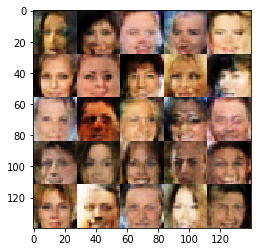

Epoch 1/2... Discriminator Loss: 0.9848... Generator Loss: 0.6480
Epoch 1/2... Discriminator Loss: 0.6569... Generator Loss: 1.1124
Epoch 1/2... Discriminator Loss: 0.7509... Generator Loss: 0.9737
Epoch 1/2... Discriminator Loss: 0.5007... Generator Loss: 1.3157
Epoch 1/2... Discriminator Loss: 0.4737... Generator Loss: 1.6642
Epoch 1/2... Discriminator Loss: 0.6146... Generator Loss: 1.6423
Epoch 1/2... Discriminator Loss: 0.7838... Generator Loss: 0.7913
Epoch 1/2... Discriminator Loss: 0.9655... Generator Loss: 0.8371
Epoch 1/2... Discriminator Loss: 0.5241... Generator Loss: 1.6831
Epoch 1/2... Discriminator Loss: 0.4704... Generator Loss: 1.3244


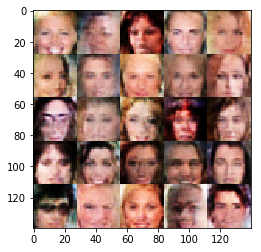

Epoch 1/2... Discriminator Loss: 1.1847... Generator Loss: 0.4692
Epoch 1/2... Discriminator Loss: 1.1608... Generator Loss: 0.5627
Epoch 1/2... Discriminator Loss: 0.7846... Generator Loss: 0.7985
Epoch 1/2... Discriminator Loss: 0.3360... Generator Loss: 1.4909
Epoch 1/2... Discriminator Loss: 0.7774... Generator Loss: 0.9092
Epoch 1/2... Discriminator Loss: 0.7373... Generator Loss: 0.9845
Epoch 1/2... Discriminator Loss: 0.5709... Generator Loss: 1.2346
Epoch 1/2... Discriminator Loss: 0.8626... Generator Loss: 0.9994
Epoch 1/2... Discriminator Loss: 0.6840... Generator Loss: 1.0699
Epoch 1/2... Discriminator Loss: 0.8508... Generator Loss: 0.9637


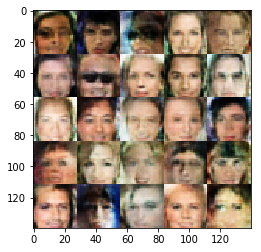

Epoch 1/2... Discriminator Loss: 0.5550... Generator Loss: 1.1564
Epoch 1/2... Discriminator Loss: 1.0108... Generator Loss: 0.5867
Epoch 1/2... Discriminator Loss: 0.4466... Generator Loss: 1.5544
Epoch 1/2... Discriminator Loss: 0.5119... Generator Loss: 1.5202
Epoch 1/2... Discriminator Loss: 0.4691... Generator Loss: 1.9057
Epoch 1/2... Discriminator Loss: 0.6162... Generator Loss: 1.1694
Epoch 1/2... Discriminator Loss: 0.7991... Generator Loss: 0.8452
Epoch 1/2... Discriminator Loss: 0.4412... Generator Loss: 1.4417
Epoch 1/2... Discriminator Loss: 0.6137... Generator Loss: 0.9846
Epoch 1/2... Discriminator Loss: 1.4490... Generator Loss: 0.3502


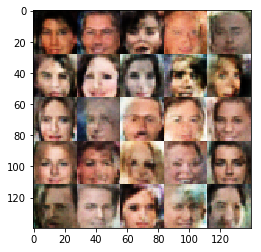

Epoch 1/2... Discriminator Loss: 0.6352... Generator Loss: 1.2219
Epoch 1/2... Discriminator Loss: 0.6906... Generator Loss: 1.0963
Epoch 1/2... Discriminator Loss: 0.7222... Generator Loss: 0.9053
Epoch 1/2... Discriminator Loss: 0.5777... Generator Loss: 1.1504
Epoch 1/2... Discriminator Loss: 0.5704... Generator Loss: 1.1774
Epoch 1/2... Discriminator Loss: 0.9611... Generator Loss: 0.6720
Epoch 1/2... Discriminator Loss: 0.4663... Generator Loss: 1.5046
Epoch 1/2... Discriminator Loss: 0.5716... Generator Loss: 1.3592
Epoch 1/2... Discriminator Loss: 0.7528... Generator Loss: 0.8641
Epoch 1/2... Discriminator Loss: 0.8554... Generator Loss: 0.8143


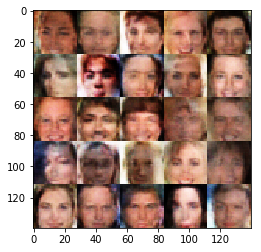

Epoch 1/2... Discriminator Loss: 1.1892... Generator Loss: 0.5176
Epoch 1/2... Discriminator Loss: 0.7044... Generator Loss: 1.1081
Epoch 1/2... Discriminator Loss: 0.7079... Generator Loss: 1.1110
Epoch 1/2... Discriminator Loss: 0.6675... Generator Loss: 1.2007
Epoch 1/2... Discriminator Loss: 0.4443... Generator Loss: 1.5306
Epoch 1/2... Discriminator Loss: 0.9525... Generator Loss: 0.6558
Epoch 1/2... Discriminator Loss: 0.6429... Generator Loss: 1.2075
Epoch 1/2... Discriminator Loss: 0.8548... Generator Loss: 0.7800
Epoch 1/2... Discriminator Loss: 0.4448... Generator Loss: 1.7146
Epoch 1/2... Discriminator Loss: 0.7838... Generator Loss: 1.1865


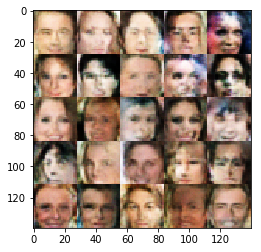

Epoch 1/2... Discriminator Loss: 0.7580... Generator Loss: 0.7862
Epoch 1/2... Discriminator Loss: 0.7862... Generator Loss: 0.8168
Epoch 1/2... Discriminator Loss: 0.6207... Generator Loss: 1.4642
Epoch 1/2... Discriminator Loss: 0.3645... Generator Loss: 1.5473
Epoch 1/2... Discriminator Loss: 0.5930... Generator Loss: 1.5760
Epoch 1/2... Discriminator Loss: 1.0562... Generator Loss: 0.5659
Epoch 1/2... Discriminator Loss: 0.7325... Generator Loss: 0.8642
Epoch 1/2... Discriminator Loss: 0.7920... Generator Loss: 0.9549
Epoch 1/2... Discriminator Loss: 0.8952... Generator Loss: 0.7310
Epoch 1/2... Discriminator Loss: 0.9568... Generator Loss: 0.6647


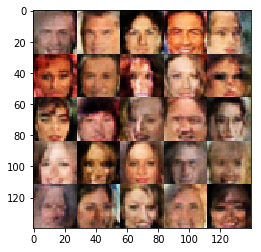

Epoch 1/2... Discriminator Loss: 1.2794... Generator Loss: 0.4826
Epoch 1/2... Discriminator Loss: 0.9060... Generator Loss: 0.7952
Epoch 1/2... Discriminator Loss: 0.5085... Generator Loss: 1.3858
Epoch 1/2... Discriminator Loss: 1.1225... Generator Loss: 0.5427
Epoch 1/2... Discriminator Loss: 0.6925... Generator Loss: 1.0124
Epoch 1/2... Discriminator Loss: 0.6455... Generator Loss: 0.9902
Epoch 1/2... Discriminator Loss: 0.6138... Generator Loss: 1.0916
Epoch 1/2... Discriminator Loss: 0.7035... Generator Loss: 1.4240
Epoch 1/2... Discriminator Loss: 0.6166... Generator Loss: 1.2170
Epoch 1/2... Discriminator Loss: 0.6503... Generator Loss: 1.0642


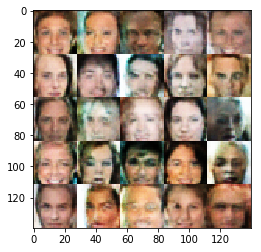

Epoch 1/2... Discriminator Loss: 0.9195... Generator Loss: 1.2597
Epoch 1/2... Discriminator Loss: 0.4746... Generator Loss: 1.5830
Epoch 1/2... Discriminator Loss: 0.5009... Generator Loss: 1.2075
Epoch 1/2... Discriminator Loss: 0.4305... Generator Loss: 1.3865
Epoch 1/2... Discriminator Loss: 0.6139... Generator Loss: 1.1378
Epoch 1/2... Discriminator Loss: 0.6796... Generator Loss: 1.0519
Epoch 1/2... Discriminator Loss: 0.5900... Generator Loss: 1.3195
Epoch 1/2... Discriminator Loss: 1.1547... Generator Loss: 0.5273
Epoch 1/2... Discriminator Loss: 0.4470... Generator Loss: 1.7187
Epoch 1/2... Discriminator Loss: 0.7373... Generator Loss: 0.8596


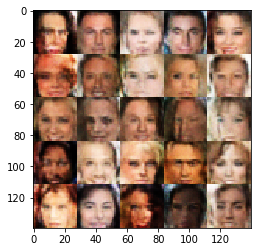

Epoch 1/2... Discriminator Loss: 0.8859... Generator Loss: 0.9971
Epoch 1/2... Discriminator Loss: 0.5243... Generator Loss: 1.7107
Epoch 1/2... Discriminator Loss: 0.8111... Generator Loss: 1.3199
Epoch 1/2... Discriminator Loss: 0.6219... Generator Loss: 1.1089
Epoch 1/2... Discriminator Loss: 0.4897... Generator Loss: 1.5142
Epoch 1/2... Discriminator Loss: 0.7653... Generator Loss: 0.8041
Epoch 1/2... Discriminator Loss: 0.6928... Generator Loss: 1.0682
Epoch 1/2... Discriminator Loss: 0.7270... Generator Loss: 0.9322
Epoch 1/2... Discriminator Loss: 0.6885... Generator Loss: 1.3594
Epoch 1/2... Discriminator Loss: 0.3548... Generator Loss: 1.7785


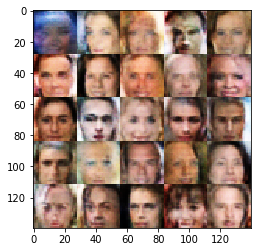

Epoch 1/2... Discriminator Loss: 0.7064... Generator Loss: 0.9972
Epoch 1/2... Discriminator Loss: 0.8029... Generator Loss: 1.2368
Epoch 1/2... Discriminator Loss: 1.0103... Generator Loss: 0.5738
Epoch 1/2... Discriminator Loss: 0.6854... Generator Loss: 1.1723
Epoch 1/2... Discriminator Loss: 0.7794... Generator Loss: 0.8042
Epoch 1/2... Discriminator Loss: 0.7169... Generator Loss: 0.9770
Epoch 1/2... Discriminator Loss: 0.6589... Generator Loss: 1.1484
Epoch 1/2... Discriminator Loss: 0.7561... Generator Loss: 0.9708
Epoch 1/2... Discriminator Loss: 1.1662... Generator Loss: 0.4854
Epoch 1/2... Discriminator Loss: 0.6467... Generator Loss: 1.4450


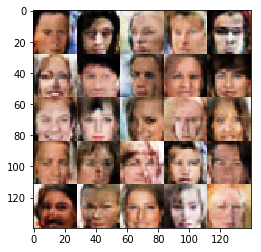

Epoch 1/2... Discriminator Loss: 0.6031... Generator Loss: 1.3581
Epoch 1/2... Discriminator Loss: 0.6521... Generator Loss: 1.0780
Epoch 1/2... Discriminator Loss: 0.9103... Generator Loss: 0.8264
Epoch 1/2... Discriminator Loss: 0.3258... Generator Loss: 1.9573
Epoch 1/2... Discriminator Loss: 0.8620... Generator Loss: 0.7848
Epoch 1/2... Discriminator Loss: 0.6017... Generator Loss: 1.0088
Epoch 1/2... Discriminator Loss: 0.8057... Generator Loss: 0.8667
Epoch 1/2... Discriminator Loss: 0.8993... Generator Loss: 0.6777
Epoch 1/2... Discriminator Loss: 0.5031... Generator Loss: 1.2704
Epoch 1/2... Discriminator Loss: 1.4287... Generator Loss: 0.3227


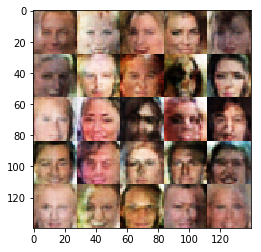

Epoch 1/2... Discriminator Loss: 0.6304... Generator Loss: 1.1901
Epoch 1/2... Discriminator Loss: 0.5289... Generator Loss: 1.1757
Epoch 1/2... Discriminator Loss: 0.3760... Generator Loss: 1.5598
Epoch 1/2... Discriminator Loss: 0.5124... Generator Loss: 1.3201
Epoch 1/2... Discriminator Loss: 0.5100... Generator Loss: 1.4440
Epoch 1/2... Discriminator Loss: 0.7993... Generator Loss: 0.8567
Epoch 1/2... Discriminator Loss: 0.7149... Generator Loss: 1.4439
Epoch 1/2... Discriminator Loss: 0.6059... Generator Loss: 1.2549
Epoch 1/2... Discriminator Loss: 0.6668... Generator Loss: 1.0341
Epoch 1/2... Discriminator Loss: 0.6631... Generator Loss: 1.0405


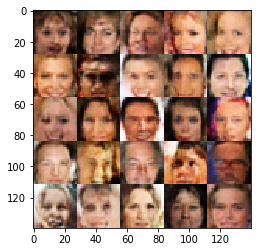

Epoch 1/2... Discriminator Loss: 0.3340... Generator Loss: 2.2522
Epoch 1/2... Discriminator Loss: 0.9138... Generator Loss: 0.6763
Epoch 1/2... Discriminator Loss: 0.9938... Generator Loss: 0.5622
Epoch 1/2... Discriminator Loss: 0.8687... Generator Loss: 0.7445
Epoch 1/2... Discriminator Loss: 0.8635... Generator Loss: 0.8140
Epoch 1/2... Discriminator Loss: 0.5825... Generator Loss: 1.3007
Epoch 1/2... Discriminator Loss: 0.9564... Generator Loss: 0.6207
Epoch 1/2... Discriminator Loss: 0.4343... Generator Loss: 1.4780
Epoch 1/2... Discriminator Loss: 0.4519... Generator Loss: 1.3970
Epoch 1/2... Discriminator Loss: 0.9980... Generator Loss: 0.6710


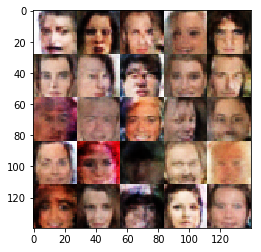

Epoch 1/2... Discriminator Loss: 0.7043... Generator Loss: 1.4381
Epoch 1/2... Discriminator Loss: 0.9105... Generator Loss: 0.7947
Epoch 1/2... Discriminator Loss: 0.5467... Generator Loss: 1.3979
Epoch 1/2... Discriminator Loss: 0.8782... Generator Loss: 1.9263
Epoch 1/2... Discriminator Loss: 0.7984... Generator Loss: 0.7546
Epoch 1/2... Discriminator Loss: 0.6164... Generator Loss: 1.2451
Epoch 1/2... Discriminator Loss: 0.4631... Generator Loss: 1.4934
Epoch 1/2... Discriminator Loss: 0.3831... Generator Loss: 1.3607
Epoch 1/2... Discriminator Loss: 0.5433... Generator Loss: 1.2660
Epoch 1/2... Discriminator Loss: 0.6849... Generator Loss: 1.4670


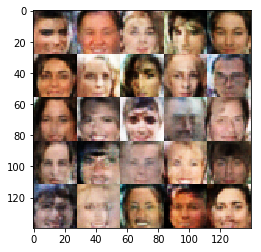

Epoch 1/2... Discriminator Loss: 0.5452... Generator Loss: 1.1722
Epoch 1/2... Discriminator Loss: 1.0601... Generator Loss: 0.5640
Epoch 1/2... Discriminator Loss: 0.4855... Generator Loss: 1.2970
Epoch 1/2... Discriminator Loss: 0.5457... Generator Loss: 1.2721
Epoch 1/2... Discriminator Loss: 0.7989... Generator Loss: 0.7019
Epoch 1/2... Discriminator Loss: 0.4591... Generator Loss: 1.2463
Epoch 1/2... Discriminator Loss: 0.9049... Generator Loss: 1.1360
Epoch 1/2... Discriminator Loss: 0.4157... Generator Loss: 1.6443
Epoch 1/2... Discriminator Loss: 1.2727... Generator Loss: 0.4168
Epoch 1/2... Discriminator Loss: 0.7562... Generator Loss: 0.8415


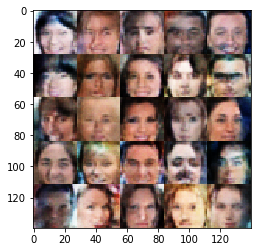

Epoch 1/2... Discriminator Loss: 0.6448... Generator Loss: 1.0777
Epoch 1/2... Discriminator Loss: 0.4627... Generator Loss: 1.7646
Epoch 1/2... Discriminator Loss: 0.7294... Generator Loss: 0.9817
Epoch 1/2... Discriminator Loss: 0.5028... Generator Loss: 1.3881
Epoch 1/2... Discriminator Loss: 0.9500... Generator Loss: 0.7013
Epoch 1/2... Discriminator Loss: 1.3362... Generator Loss: 0.4291
Epoch 1/2... Discriminator Loss: 0.6436... Generator Loss: 0.9796
Epoch 1/2... Discriminator Loss: 0.9642... Generator Loss: 0.8147
Epoch 1/2... Discriminator Loss: 0.6612... Generator Loss: 1.1768
Epoch 1/2... Discriminator Loss: 0.7130... Generator Loss: 1.0721


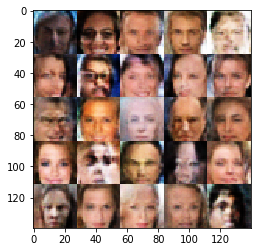

Epoch 1/2... Discriminator Loss: 0.7171... Generator Loss: 0.8890
Epoch 1/2... Discriminator Loss: 0.6793... Generator Loss: 1.4426
Epoch 1/2... Discriminator Loss: 0.7515... Generator Loss: 0.8919
Epoch 1/2... Discriminator Loss: 0.3522... Generator Loss: 2.0544
Epoch 1/2... Discriminator Loss: 0.8980... Generator Loss: 0.6655
Epoch 1/2... Discriminator Loss: 1.0542... Generator Loss: 0.6097
Epoch 1/2... Discriminator Loss: 0.6476... Generator Loss: 1.2418
Epoch 1/2... Discriminator Loss: 0.5736... Generator Loss: 1.7615
Epoch 1/2... Discriminator Loss: 0.5207... Generator Loss: 1.3271
Epoch 1/2... Discriminator Loss: 0.5346... Generator Loss: 1.6171


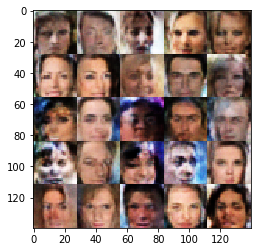

Epoch 1/2... Discriminator Loss: 0.6514... Generator Loss: 1.1176
Epoch 1/2... Discriminator Loss: 0.8190... Generator Loss: 0.7582
Epoch 1/2... Discriminator Loss: 0.6820... Generator Loss: 1.1835
Epoch 1/2... Discriminator Loss: 0.3177... Generator Loss: 1.7360
Epoch 1/2... Discriminator Loss: 0.4495... Generator Loss: 1.9277
Epoch 1/2... Discriminator Loss: 0.3236... Generator Loss: 1.7795
Epoch 1/2... Discriminator Loss: 0.4906... Generator Loss: 1.4899
Epoch 1/2... Discriminator Loss: 0.4873... Generator Loss: 1.4149
Epoch 1/2... Discriminator Loss: 0.7072... Generator Loss: 0.9426
Epoch 1/2... Discriminator Loss: 0.7293... Generator Loss: 0.9791


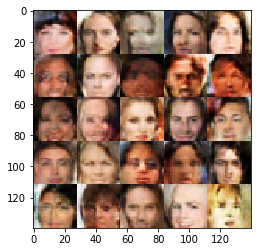

Epoch 1/2... Discriminator Loss: 0.6859... Generator Loss: 1.2326
Epoch 1/2... Discriminator Loss: 0.7069... Generator Loss: 0.9565
Epoch 1/2... Discriminator Loss: 0.7923... Generator Loss: 0.8905
Epoch 1/2... Discriminator Loss: 0.3452... Generator Loss: 1.9216
Epoch 1/2... Discriminator Loss: 0.5610... Generator Loss: 1.2006
Epoch 1/2... Discriminator Loss: 0.4448... Generator Loss: 2.0177
Epoch 1/2... Discriminator Loss: 0.8298... Generator Loss: 0.8447
Epoch 1/2... Discriminator Loss: 0.7419... Generator Loss: 1.1056
Epoch 1/2... Discriminator Loss: 0.5718... Generator Loss: 1.2834
Epoch 1/2... Discriminator Loss: 0.4420... Generator Loss: 1.7726


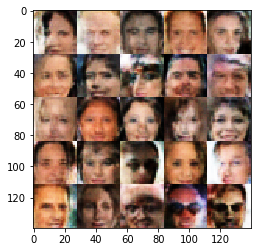

Epoch 1/2... Discriminator Loss: 0.6534... Generator Loss: 0.9981
Epoch 1/2... Discriminator Loss: 0.3672... Generator Loss: 1.6933
Epoch 1/2... Discriminator Loss: 0.6146... Generator Loss: 1.1973
Epoch 1/2... Discriminator Loss: 0.3782... Generator Loss: 1.4240
Epoch 1/2... Discriminator Loss: 0.8841... Generator Loss: 0.6930
Epoch 1/2... Discriminator Loss: 0.7053... Generator Loss: 1.0792
Epoch 1/2... Discriminator Loss: 0.4711... Generator Loss: 1.6487
Epoch 1/2... Discriminator Loss: 0.9880... Generator Loss: 0.6535
Epoch 1/2... Discriminator Loss: 0.7822... Generator Loss: 0.8267
Epoch 1/2... Discriminator Loss: 0.8859... Generator Loss: 0.7534


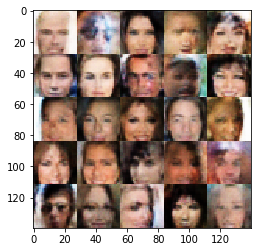

Epoch 1/2... Discriminator Loss: 0.7123... Generator Loss: 1.0283
Epoch 1/2... Discriminator Loss: 0.6506... Generator Loss: 1.0744
Epoch 1/2... Discriminator Loss: 0.6195... Generator Loss: 1.8583
Epoch 2/2... Discriminator Loss: 0.4238... Generator Loss: 1.8755
Epoch 2/2... Discriminator Loss: 0.8121... Generator Loss: 0.7878
Epoch 2/2... Discriminator Loss: 0.4647... Generator Loss: 1.2841
Epoch 2/2... Discriminator Loss: 0.7455... Generator Loss: 0.9038
Epoch 2/2... Discriminator Loss: 0.8832... Generator Loss: 0.9625
Epoch 2/2... Discriminator Loss: 0.8929... Generator Loss: 0.7876
Epoch 2/2... Discriminator Loss: 0.4967... Generator Loss: 1.3087


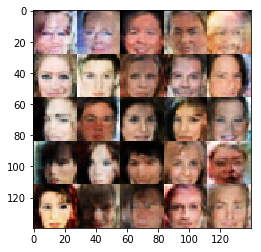

Epoch 2/2... Discriminator Loss: 1.0462... Generator Loss: 0.6296
Epoch 2/2... Discriminator Loss: 0.6713... Generator Loss: 0.9620
Epoch 2/2... Discriminator Loss: 0.5067... Generator Loss: 1.5154
Epoch 2/2... Discriminator Loss: 0.7022... Generator Loss: 1.0283
Epoch 2/2... Discriminator Loss: 0.1987... Generator Loss: 1.9340
Epoch 2/2... Discriminator Loss: 1.2395... Generator Loss: 0.4493
Epoch 2/2... Discriminator Loss: 0.9283... Generator Loss: 0.6879
Epoch 2/2... Discriminator Loss: 0.7092... Generator Loss: 0.9453
Epoch 2/2... Discriminator Loss: 0.8251... Generator Loss: 0.7198
Epoch 2/2... Discriminator Loss: 0.3919... Generator Loss: 1.5902


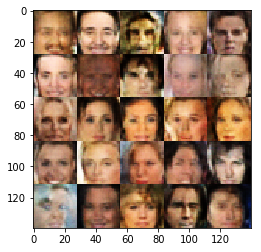

Epoch 2/2... Discriminator Loss: 0.7851... Generator Loss: 0.9514
Epoch 2/2... Discriminator Loss: 0.8557... Generator Loss: 0.7565
Epoch 2/2... Discriminator Loss: 0.4412... Generator Loss: 1.8930
Epoch 2/2... Discriminator Loss: 0.5744... Generator Loss: 1.1782
Epoch 2/2... Discriminator Loss: 0.8434... Generator Loss: 0.7576
Epoch 2/2... Discriminator Loss: 0.7637... Generator Loss: 0.9244
Epoch 2/2... Discriminator Loss: 0.5521... Generator Loss: 1.6064
Epoch 2/2... Discriminator Loss: 0.5777... Generator Loss: 1.1355
Epoch 2/2... Discriminator Loss: 0.6557... Generator Loss: 1.0539
Epoch 2/2... Discriminator Loss: 1.2878... Generator Loss: 0.4252


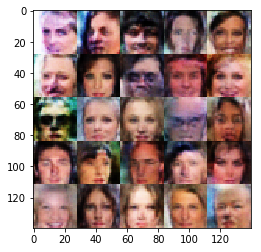

Epoch 2/2... Discriminator Loss: 0.7197... Generator Loss: 0.9823
Epoch 2/2... Discriminator Loss: 0.7603... Generator Loss: 0.9575
Epoch 2/2... Discriminator Loss: 0.7728... Generator Loss: 0.9879
Epoch 2/2... Discriminator Loss: 1.1667... Generator Loss: 1.2145
Epoch 2/2... Discriminator Loss: 0.8318... Generator Loss: 0.8357
Epoch 2/2... Discriminator Loss: 0.8208... Generator Loss: 0.8572
Epoch 2/2... Discriminator Loss: 0.7206... Generator Loss: 1.2440
Epoch 2/2... Discriminator Loss: 0.8762... Generator Loss: 0.8646
Epoch 2/2... Discriminator Loss: 0.7504... Generator Loss: 1.6724
Epoch 2/2... Discriminator Loss: 0.7317... Generator Loss: 1.2578


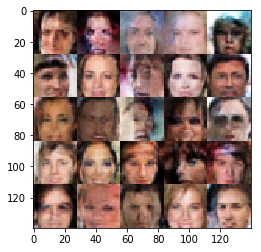

Epoch 2/2... Discriminator Loss: 0.5558... Generator Loss: 1.1387
Epoch 2/2... Discriminator Loss: 0.8048... Generator Loss: 0.9302
Epoch 2/2... Discriminator Loss: 0.8471... Generator Loss: 0.7235
Epoch 2/2... Discriminator Loss: 1.2585... Generator Loss: 0.4644
Epoch 2/2... Discriminator Loss: 0.5165... Generator Loss: 1.3598
Epoch 2/2... Discriminator Loss: 1.0264... Generator Loss: 0.6235
Epoch 2/2... Discriminator Loss: 0.5482... Generator Loss: 1.2512
Epoch 2/2... Discriminator Loss: 0.9148... Generator Loss: 0.7753
Epoch 2/2... Discriminator Loss: 0.4580... Generator Loss: 1.2708
Epoch 2/2... Discriminator Loss: 0.7064... Generator Loss: 0.8873


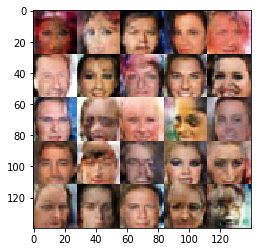

Epoch 2/2... Discriminator Loss: 0.6296... Generator Loss: 1.0038
Epoch 2/2... Discriminator Loss: 0.4201... Generator Loss: 1.6284
Epoch 2/2... Discriminator Loss: 0.5667... Generator Loss: 1.1360
Epoch 2/2... Discriminator Loss: 0.4692... Generator Loss: 1.2372
Epoch 2/2... Discriminator Loss: 0.9410... Generator Loss: 0.6556
Epoch 2/2... Discriminator Loss: 0.3546... Generator Loss: 1.7157
Epoch 2/2... Discriminator Loss: 0.5514... Generator Loss: 1.2667
Epoch 2/2... Discriminator Loss: 0.4123... Generator Loss: 1.6550
Epoch 2/2... Discriminator Loss: 0.6839... Generator Loss: 0.9683
Epoch 2/2... Discriminator Loss: 0.4908... Generator Loss: 1.3322


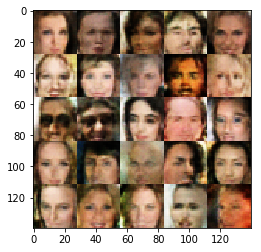

Epoch 2/2... Discriminator Loss: 0.8268... Generator Loss: 0.6917
Epoch 2/2... Discriminator Loss: 0.4182... Generator Loss: 2.1238
Epoch 2/2... Discriminator Loss: 0.9646... Generator Loss: 0.6549
Epoch 2/2... Discriminator Loss: 0.3982... Generator Loss: 1.8575
Epoch 2/2... Discriminator Loss: 0.4760... Generator Loss: 1.6554
Epoch 2/2... Discriminator Loss: 0.8862... Generator Loss: 0.7735
Epoch 2/2... Discriminator Loss: 0.9920... Generator Loss: 0.6725
Epoch 2/2... Discriminator Loss: 0.9213... Generator Loss: 0.7600
Epoch 2/2... Discriminator Loss: 0.5365... Generator Loss: 1.3036
Epoch 2/2... Discriminator Loss: 0.9042... Generator Loss: 0.6368


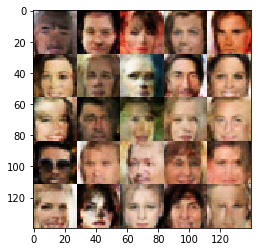

Epoch 2/2... Discriminator Loss: 0.3430... Generator Loss: 1.9605
Epoch 2/2... Discriminator Loss: 1.0177... Generator Loss: 0.6425
Epoch 2/2... Discriminator Loss: 0.5787... Generator Loss: 1.2838
Epoch 2/2... Discriminator Loss: 0.4491... Generator Loss: 1.3432
Epoch 2/2... Discriminator Loss: 0.5987... Generator Loss: 1.1070
Epoch 2/2... Discriminator Loss: 0.6024... Generator Loss: 1.6466
Epoch 2/2... Discriminator Loss: 0.6362... Generator Loss: 0.9989
Epoch 2/2... Discriminator Loss: 0.6534... Generator Loss: 0.9937
Epoch 2/2... Discriminator Loss: 0.9885... Generator Loss: 0.6387
Epoch 2/2... Discriminator Loss: 0.7137... Generator Loss: 0.9858


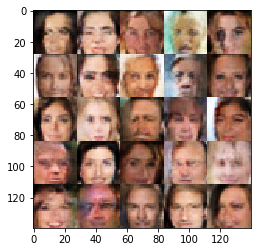

Epoch 2/2... Discriminator Loss: 0.5795... Generator Loss: 1.5368
Epoch 2/2... Discriminator Loss: 0.8107... Generator Loss: 0.9294
Epoch 2/2... Discriminator Loss: 0.7647... Generator Loss: 0.8456
Epoch 2/2... Discriminator Loss: 0.6390... Generator Loss: 1.0367
Epoch 2/2... Discriminator Loss: 0.8137... Generator Loss: 0.8731
Epoch 2/2... Discriminator Loss: 1.1705... Generator Loss: 0.4970
Epoch 2/2... Discriminator Loss: 0.4475... Generator Loss: 1.4792
Epoch 2/2... Discriminator Loss: 0.7524... Generator Loss: 1.0587
Epoch 2/2... Discriminator Loss: 0.4519... Generator Loss: 1.5377
Epoch 2/2... Discriminator Loss: 0.6876... Generator Loss: 0.9747


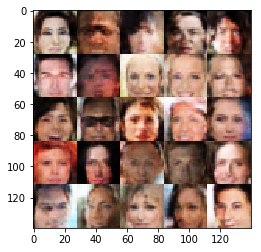

Epoch 2/2... Discriminator Loss: 0.5082... Generator Loss: 1.8726
Epoch 2/2... Discriminator Loss: 1.0459... Generator Loss: 0.6011
Epoch 2/2... Discriminator Loss: 0.8931... Generator Loss: 0.7736
Epoch 2/2... Discriminator Loss: 0.8651... Generator Loss: 1.1448
Epoch 2/2... Discriminator Loss: 0.7648... Generator Loss: 0.7642
Epoch 2/2... Discriminator Loss: 0.3699... Generator Loss: 1.5596
Epoch 2/2... Discriminator Loss: 0.4868... Generator Loss: 1.2412
Epoch 2/2... Discriminator Loss: 0.7048... Generator Loss: 1.0618
Epoch 2/2... Discriminator Loss: 0.6574... Generator Loss: 0.9533
Epoch 2/2... Discriminator Loss: 0.7404... Generator Loss: 0.8451


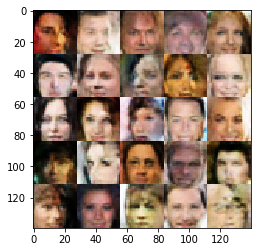

Epoch 2/2... Discriminator Loss: 0.5151... Generator Loss: 1.3239
Epoch 2/2... Discriminator Loss: 0.9984... Generator Loss: 0.6111
Epoch 2/2... Discriminator Loss: 0.5025... Generator Loss: 1.1698
Epoch 2/2... Discriminator Loss: 0.6765... Generator Loss: 1.0427
Epoch 2/2... Discriminator Loss: 0.7691... Generator Loss: 0.9045
Epoch 2/2... Discriminator Loss: 0.5222... Generator Loss: 1.3757
Epoch 2/2... Discriminator Loss: 0.5445... Generator Loss: 1.1863
Epoch 2/2... Discriminator Loss: 0.7253... Generator Loss: 0.9592
Epoch 2/2... Discriminator Loss: 0.6337... Generator Loss: 1.2193
Epoch 2/2... Discriminator Loss: 0.9605... Generator Loss: 0.8280


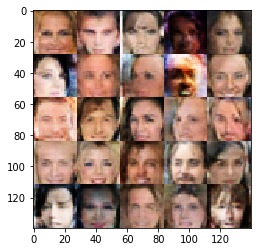

Epoch 2/2... Discriminator Loss: 0.5460... Generator Loss: 1.1184
Epoch 2/2... Discriminator Loss: 0.4386... Generator Loss: 1.4056
Epoch 2/2... Discriminator Loss: 0.4373... Generator Loss: 1.6647
Epoch 2/2... Discriminator Loss: 0.6594... Generator Loss: 1.0532
Epoch 2/2... Discriminator Loss: 0.4313... Generator Loss: 1.3761
Epoch 2/2... Discriminator Loss: 0.4812... Generator Loss: 1.3132
Epoch 2/2... Discriminator Loss: 0.4822... Generator Loss: 2.3035
Epoch 2/2... Discriminator Loss: 0.7924... Generator Loss: 0.9715
Epoch 2/2... Discriminator Loss: 1.0737... Generator Loss: 0.5502
Epoch 2/2... Discriminator Loss: 0.2695... Generator Loss: 1.7487


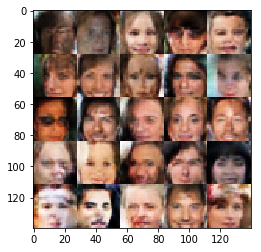

Epoch 2/2... Discriminator Loss: 0.7657... Generator Loss: 1.2883
Epoch 2/2... Discriminator Loss: 0.4099... Generator Loss: 1.6480
Epoch 2/2... Discriminator Loss: 0.5169... Generator Loss: 1.2177
Epoch 2/2... Discriminator Loss: 0.5196... Generator Loss: 1.7224
Epoch 2/2... Discriminator Loss: 0.7416... Generator Loss: 0.8911
Epoch 2/2... Discriminator Loss: 0.4877... Generator Loss: 1.1274
Epoch 2/2... Discriminator Loss: 1.1104... Generator Loss: 0.5574
Epoch 2/2... Discriminator Loss: 0.7945... Generator Loss: 0.7943
Epoch 2/2... Discriminator Loss: 0.5728... Generator Loss: 1.2086
Epoch 2/2... Discriminator Loss: 0.6440... Generator Loss: 1.1740


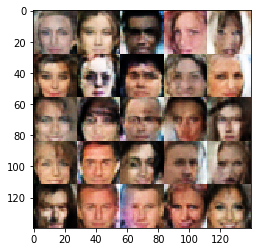

Epoch 2/2... Discriminator Loss: 0.8404... Generator Loss: 1.6159
Epoch 2/2... Discriminator Loss: 0.8305... Generator Loss: 0.8758
Epoch 2/2... Discriminator Loss: 0.6404... Generator Loss: 1.0039
Epoch 2/2... Discriminator Loss: 0.8778... Generator Loss: 0.8172
Epoch 2/2... Discriminator Loss: 1.3284... Generator Loss: 0.4397
Epoch 2/2... Discriminator Loss: 0.7490... Generator Loss: 0.9386
Epoch 2/2... Discriminator Loss: 0.4257... Generator Loss: 1.4726
Epoch 2/2... Discriminator Loss: 0.4628... Generator Loss: 1.4352
Epoch 2/2... Discriminator Loss: 0.8411... Generator Loss: 0.7584
Epoch 2/2... Discriminator Loss: 0.9708... Generator Loss: 0.6024


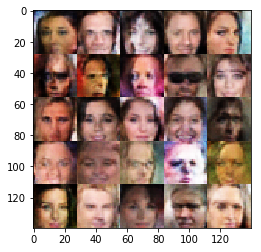

Epoch 2/2... Discriminator Loss: 0.4906... Generator Loss: 1.2994
Epoch 2/2... Discriminator Loss: 0.7063... Generator Loss: 0.9073
Epoch 2/2... Discriminator Loss: 0.9188... Generator Loss: 0.6669
Epoch 2/2... Discriminator Loss: 0.4631... Generator Loss: 1.5939
Epoch 2/2... Discriminator Loss: 0.6539... Generator Loss: 1.1163
Epoch 2/2... Discriminator Loss: 0.4892... Generator Loss: 1.4043
Epoch 2/2... Discriminator Loss: 0.6197... Generator Loss: 1.3650
Epoch 2/2... Discriminator Loss: 0.5093... Generator Loss: 1.2579
Epoch 2/2... Discriminator Loss: 0.4862... Generator Loss: 1.2485
Epoch 2/2... Discriminator Loss: 0.7499... Generator Loss: 1.5198


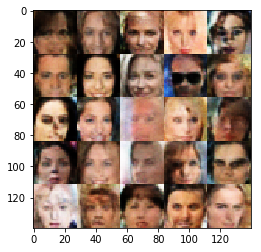

Epoch 2/2... Discriminator Loss: 0.3999... Generator Loss: 1.9784
Epoch 2/2... Discriminator Loss: 1.1013... Generator Loss: 0.5526
Epoch 2/2... Discriminator Loss: 0.7508... Generator Loss: 0.8804
Epoch 2/2... Discriminator Loss: 0.6620... Generator Loss: 0.9299
Epoch 2/2... Discriminator Loss: 0.5032... Generator Loss: 1.4767
Epoch 2/2... Discriminator Loss: 0.3368... Generator Loss: 1.5962
Epoch 2/2... Discriminator Loss: 0.5438... Generator Loss: 1.1694
Epoch 2/2... Discriminator Loss: 1.3689... Generator Loss: 0.4274
Epoch 2/2... Discriminator Loss: 0.4551... Generator Loss: 1.7609
Epoch 2/2... Discriminator Loss: 0.4450... Generator Loss: 1.7644


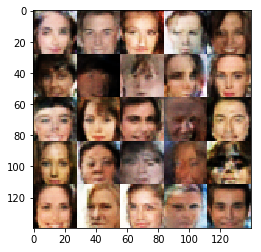

Epoch 2/2... Discriminator Loss: 0.6191... Generator Loss: 0.9510
Epoch 2/2... Discriminator Loss: 0.4439... Generator Loss: 1.4598
Epoch 2/2... Discriminator Loss: 0.9713... Generator Loss: 0.6276
Epoch 2/2... Discriminator Loss: 0.4947... Generator Loss: 1.5459
Epoch 2/2... Discriminator Loss: 0.6765... Generator Loss: 0.9433
Epoch 2/2... Discriminator Loss: 0.6124... Generator Loss: 1.1581
Epoch 2/2... Discriminator Loss: 0.7454... Generator Loss: 0.9181
Epoch 2/2... Discriminator Loss: 0.4461... Generator Loss: 1.3181
Epoch 2/2... Discriminator Loss: 0.4429... Generator Loss: 1.6020
Epoch 2/2... Discriminator Loss: 0.3042... Generator Loss: 1.7850


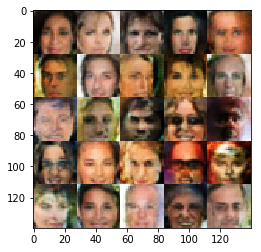

Epoch 2/2... Discriminator Loss: 0.7772... Generator Loss: 1.0465
Epoch 2/2... Discriminator Loss: 0.5777... Generator Loss: 1.1667
Epoch 2/2... Discriminator Loss: 0.7051... Generator Loss: 1.0644
Epoch 2/2... Discriminator Loss: 0.6948... Generator Loss: 0.9896
Epoch 2/2... Discriminator Loss: 0.5622... Generator Loss: 1.1327
Epoch 2/2... Discriminator Loss: 0.8107... Generator Loss: 0.8383
Epoch 2/2... Discriminator Loss: 0.8046... Generator Loss: 1.0226
Epoch 2/2... Discriminator Loss: 0.5778... Generator Loss: 1.2123
Epoch 2/2... Discriminator Loss: 0.5377... Generator Loss: 1.1455
Epoch 2/2... Discriminator Loss: 1.0711... Generator Loss: 0.5765


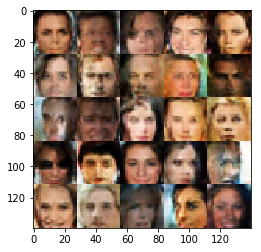

Epoch 2/2... Discriminator Loss: 1.3890... Generator Loss: 0.3923
Epoch 2/2... Discriminator Loss: 0.7891... Generator Loss: 1.0268
Epoch 2/2... Discriminator Loss: 0.8708... Generator Loss: 0.8150
Epoch 2/2... Discriminator Loss: 0.6067... Generator Loss: 1.1497
Epoch 2/2... Discriminator Loss: 0.4445... Generator Loss: 1.4051
Epoch 2/2... Discriminator Loss: 0.5868... Generator Loss: 1.3631
Epoch 2/2... Discriminator Loss: 0.4321... Generator Loss: 1.4162
Epoch 2/2... Discriminator Loss: 0.8967... Generator Loss: 0.6943
Epoch 2/2... Discriminator Loss: 0.5619... Generator Loss: 1.3064
Epoch 2/2... Discriminator Loss: 0.9991... Generator Loss: 0.6852


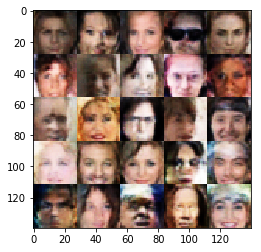

Epoch 2/2... Discriminator Loss: 0.5498... Generator Loss: 2.2958
Epoch 2/2... Discriminator Loss: 0.4974... Generator Loss: 1.4263
Epoch 2/2... Discriminator Loss: 1.3879... Generator Loss: 0.3677
Epoch 2/2... Discriminator Loss: 0.7235... Generator Loss: 1.0046
Epoch 2/2... Discriminator Loss: 0.5193... Generator Loss: 1.2554
Epoch 2/2... Discriminator Loss: 0.6817... Generator Loss: 1.5244
Epoch 2/2... Discriminator Loss: 0.9383... Generator Loss: 1.2333
Epoch 2/2... Discriminator Loss: 0.5337... Generator Loss: 1.5370
Epoch 2/2... Discriminator Loss: 0.4057... Generator Loss: 1.5944
Epoch 2/2... Discriminator Loss: 0.7586... Generator Loss: 0.9497


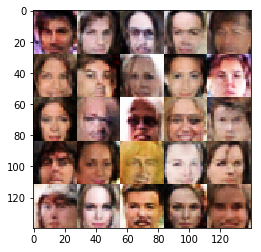

Epoch 2/2... Discriminator Loss: 0.5861... Generator Loss: 1.1617
Epoch 2/2... Discriminator Loss: 0.5316... Generator Loss: 1.3248
Epoch 2/2... Discriminator Loss: 0.3580... Generator Loss: 1.4253
Epoch 2/2... Discriminator Loss: 0.3793... Generator Loss: 2.7022
Epoch 2/2... Discriminator Loss: 0.7445... Generator Loss: 0.8807
Epoch 2/2... Discriminator Loss: 0.7892... Generator Loss: 0.9143
Epoch 2/2... Discriminator Loss: 0.5428... Generator Loss: 1.1647
Epoch 2/2... Discriminator Loss: 0.3086... Generator Loss: 1.9836
Epoch 2/2... Discriminator Loss: 0.5855... Generator Loss: 1.1186
Epoch 2/2... Discriminator Loss: 0.5871... Generator Loss: 1.1695


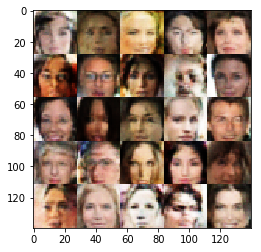

Epoch 2/2... Discriminator Loss: 0.5657... Generator Loss: 1.7017
Epoch 2/2... Discriminator Loss: 0.8773... Generator Loss: 2.2291
Epoch 2/2... Discriminator Loss: 0.9054... Generator Loss: 0.6733
Epoch 2/2... Discriminator Loss: 0.7690... Generator Loss: 1.0647
Epoch 2/2... Discriminator Loss: 0.5838... Generator Loss: 1.3045
Epoch 2/2... Discriminator Loss: 0.3413... Generator Loss: 1.6912
Epoch 2/2... Discriminator Loss: 0.8076... Generator Loss: 0.7697
Epoch 2/2... Discriminator Loss: 0.4090... Generator Loss: 1.5846
Epoch 2/2... Discriminator Loss: 0.7511... Generator Loss: 0.8835
Epoch 2/2... Discriminator Loss: 0.3274... Generator Loss: 1.9549


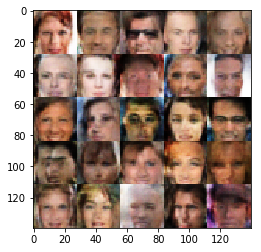

Epoch 2/2... Discriminator Loss: 0.3557... Generator Loss: 1.7787
Epoch 2/2... Discriminator Loss: 0.5023... Generator Loss: 1.3277
Epoch 2/2... Discriminator Loss: 0.9428... Generator Loss: 0.6164
Epoch 2/2... Discriminator Loss: 0.5784... Generator Loss: 1.2528
Epoch 2/2... Discriminator Loss: 0.8673... Generator Loss: 0.7727
Epoch 2/2... Discriminator Loss: 0.3751... Generator Loss: 1.7405
Epoch 2/2... Discriminator Loss: 0.3151... Generator Loss: 1.7691
Epoch 2/2... Discriminator Loss: 0.6783... Generator Loss: 1.2263
Epoch 2/2... Discriminator Loss: 0.5126... Generator Loss: 1.0986
Epoch 2/2... Discriminator Loss: 0.5580... Generator Loss: 1.2045


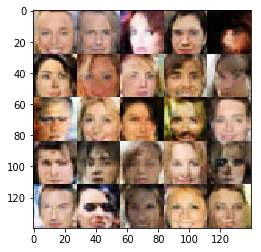

Epoch 2/2... Discriminator Loss: 0.7844... Generator Loss: 0.8505
Epoch 2/2... Discriminator Loss: 0.4394... Generator Loss: 1.5949
Epoch 2/2... Discriminator Loss: 0.8984... Generator Loss: 0.7594
Epoch 2/2... Discriminator Loss: 0.4514... Generator Loss: 1.9340
Epoch 2/2... Discriminator Loss: 0.9414... Generator Loss: 0.6973
Epoch 2/2... Discriminator Loss: 1.3316... Generator Loss: 0.4335
Epoch 2/2... Discriminator Loss: 0.5777... Generator Loss: 1.2262
Epoch 2/2... Discriminator Loss: 0.7126... Generator Loss: 1.4930
Epoch 2/2... Discriminator Loss: 0.2920... Generator Loss: 2.1995
Epoch 2/2... Discriminator Loss: 0.6747... Generator Loss: 0.9137


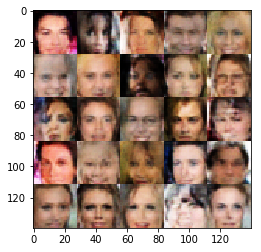

Epoch 2/2... Discriminator Loss: 0.5968... Generator Loss: 1.2974
Epoch 2/2... Discriminator Loss: 0.7637... Generator Loss: 0.8446
Epoch 2/2... Discriminator Loss: 0.5111... Generator Loss: 1.3599
Epoch 2/2... Discriminator Loss: 0.3417... Generator Loss: 2.1825
Epoch 2/2... Discriminator Loss: 1.1457... Generator Loss: 0.4411
Epoch 2/2... Discriminator Loss: 0.8163... Generator Loss: 1.1413
Epoch 2/2... Discriminator Loss: 0.6412... Generator Loss: 1.2054
Epoch 2/2... Discriminator Loss: 0.8089... Generator Loss: 0.7926
Epoch 2/2... Discriminator Loss: 0.8875... Generator Loss: 0.6834
Epoch 2/2... Discriminator Loss: 0.7641... Generator Loss: 0.9375


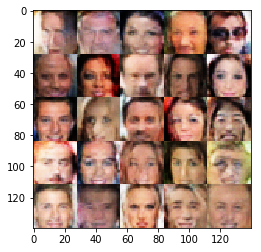

Epoch 2/2... Discriminator Loss: 1.1566... Generator Loss: 0.4496
Epoch 2/2... Discriminator Loss: 0.8919... Generator Loss: 0.7345
Epoch 2/2... Discriminator Loss: 0.7742... Generator Loss: 1.6888
Epoch 2/2... Discriminator Loss: 1.3478... Generator Loss: 0.3914
Epoch 2/2... Discriminator Loss: 0.9448... Generator Loss: 0.7267
Epoch 2/2... Discriminator Loss: 0.6763... Generator Loss: 0.9749
Epoch 2/2... Discriminator Loss: 0.5259... Generator Loss: 1.4205
Epoch 2/2... Discriminator Loss: 0.7966... Generator Loss: 0.9387
Epoch 2/2... Discriminator Loss: 0.9145... Generator Loss: 1.0728
Epoch 2/2... Discriminator Loss: 0.6662... Generator Loss: 1.6075


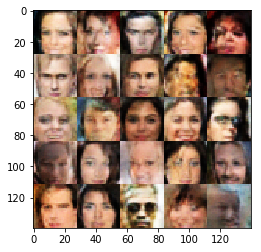

Epoch 2/2... Discriminator Loss: 0.8975... Generator Loss: 0.9163
Epoch 2/2... Discriminator Loss: 0.7481... Generator Loss: 0.9425
Epoch 2/2... Discriminator Loss: 0.7700... Generator Loss: 1.0841
Epoch 2/2... Discriminator Loss: 0.4870... Generator Loss: 1.3113
Epoch 2/2... Discriminator Loss: 0.4877... Generator Loss: 1.6967
Epoch 2/2... Discriminator Loss: 0.5064... Generator Loss: 1.2148
Epoch 2/2... Discriminator Loss: 0.9529... Generator Loss: 0.6624
Epoch 2/2... Discriminator Loss: 0.4514... Generator Loss: 1.4177
Epoch 2/2... Discriminator Loss: 0.7258... Generator Loss: 1.0590
Epoch 2/2... Discriminator Loss: 0.6760... Generator Loss: 1.3396


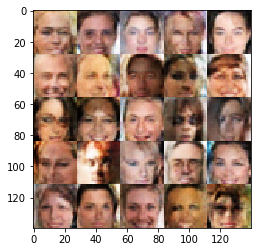

Epoch 2/2... Discriminator Loss: 0.6114... Generator Loss: 1.2605
Epoch 2/2... Discriminator Loss: 0.6931... Generator Loss: 0.9108
Epoch 2/2... Discriminator Loss: 0.4899... Generator Loss: 1.3117
Epoch 2/2... Discriminator Loss: 0.3706... Generator Loss: 1.7579
Epoch 2/2... Discriminator Loss: 0.3600... Generator Loss: 1.7592
Epoch 2/2... Discriminator Loss: 0.5733... Generator Loss: 1.2997
Epoch 2/2... Discriminator Loss: 0.6588... Generator Loss: 0.9446
Epoch 2/2... Discriminator Loss: 0.7940... Generator Loss: 0.8808
Epoch 2/2... Discriminator Loss: 0.5048... Generator Loss: 1.2726
Epoch 2/2... Discriminator Loss: 0.4879... Generator Loss: 1.3225


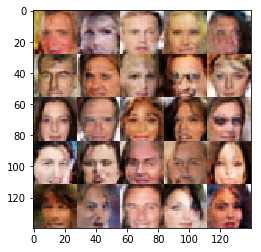

Epoch 2/2... Discriminator Loss: 0.5400... Generator Loss: 2.1296
Epoch 2/2... Discriminator Loss: 0.7076... Generator Loss: 0.8594
Epoch 2/2... Discriminator Loss: 0.9029... Generator Loss: 0.6835
Epoch 2/2... Discriminator Loss: 0.3916... Generator Loss: 1.5722
Epoch 2/2... Discriminator Loss: 0.4284... Generator Loss: 1.3366
Epoch 2/2... Discriminator Loss: 0.3762... Generator Loss: 1.6749
Epoch 2/2... Discriminator Loss: 0.3666... Generator Loss: 1.6236
Epoch 2/2... Discriminator Loss: 0.5329... Generator Loss: 1.3972
Epoch 2/2... Discriminator Loss: 0.7767... Generator Loss: 0.7691
Epoch 2/2... Discriminator Loss: 0.3761... Generator Loss: 1.8133


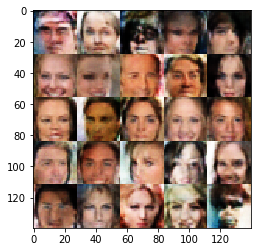

Epoch 2/2... Discriminator Loss: 0.6300... Generator Loss: 0.9828
Epoch 2/2... Discriminator Loss: 0.6048... Generator Loss: 1.2593
Epoch 2/2... Discriminator Loss: 0.6827... Generator Loss: 0.9169
Epoch 2/2... Discriminator Loss: 0.8796... Generator Loss: 0.6456
Epoch 2/2... Discriminator Loss: 0.3764... Generator Loss: 1.6301
Epoch 2/2... Discriminator Loss: 0.3088... Generator Loss: 2.0614
Epoch 2/2... Discriminator Loss: 0.9878... Generator Loss: 0.6161
Epoch 2/2... Discriminator Loss: 0.5435... Generator Loss: 1.2100
Epoch 2/2... Discriminator Loss: 0.3863... Generator Loss: 1.4200
Epoch 2/2... Discriminator Loss: 0.4179... Generator Loss: 1.5974


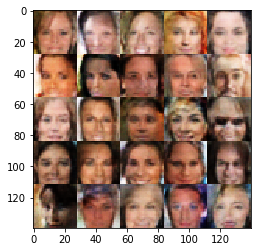

Epoch 2/2... Discriminator Loss: 0.5840... Generator Loss: 1.2823
Epoch 2/2... Discriminator Loss: 0.7332... Generator Loss: 1.0990
Epoch 2/2... Discriminator Loss: 0.6177... Generator Loss: 1.6736
Epoch 2/2... Discriminator Loss: 0.9179... Generator Loss: 0.7886
Epoch 2/2... Discriminator Loss: 0.3861... Generator Loss: 1.5949
Epoch 2/2... Discriminator Loss: 0.4006... Generator Loss: 1.6942
Epoch 2/2... Discriminator Loss: 0.8294... Generator Loss: 0.9058
Epoch 2/2... Discriminator Loss: 0.5914... Generator Loss: 1.0972
Epoch 2/2... Discriminator Loss: 0.5467... Generator Loss: 1.4863
Epoch 2/2... Discriminator Loss: 0.8762... Generator Loss: 0.9187


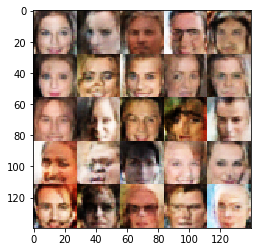

Epoch 2/2... Discriminator Loss: 0.7538... Generator Loss: 0.8810
Epoch 2/2... Discriminator Loss: 0.5979... Generator Loss: 1.2830
Epoch 2/2... Discriminator Loss: 0.4491... Generator Loss: 1.3422
Epoch 2/2... Discriminator Loss: 0.6618... Generator Loss: 0.9875
Epoch 2/2... Discriminator Loss: 0.6175... Generator Loss: 1.1193
Epoch 2/2... Discriminator Loss: 0.8699... Generator Loss: 0.6689
Epoch 2/2... Discriminator Loss: 0.3531... Generator Loss: 1.5097
Epoch 2/2... Discriminator Loss: 0.4643... Generator Loss: 1.3894
Epoch 2/2... Discriminator Loss: 0.6375... Generator Loss: 0.9821
Epoch 2/2... Discriminator Loss: 0.6113... Generator Loss: 1.1437


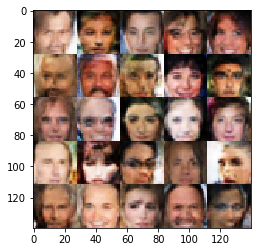

Epoch 2/2... Discriminator Loss: 0.5826... Generator Loss: 1.1855
Epoch 2/2... Discriminator Loss: 0.7645... Generator Loss: 0.8729
Epoch 2/2... Discriminator Loss: 0.7031... Generator Loss: 1.7291
Epoch 2/2... Discriminator Loss: 1.0362... Generator Loss: 0.6276
Epoch 2/2... Discriminator Loss: 0.8224... Generator Loss: 0.7730
Epoch 2/2... Discriminator Loss: 0.8225... Generator Loss: 0.8176
Epoch 2/2... Discriminator Loss: 0.6613... Generator Loss: 1.0002
Epoch 2/2... Discriminator Loss: 0.6022... Generator Loss: 1.0652
Epoch 2/2... Discriminator Loss: 0.4102... Generator Loss: 1.8462
Epoch 2/2... Discriminator Loss: 0.3920... Generator Loss: 1.9569


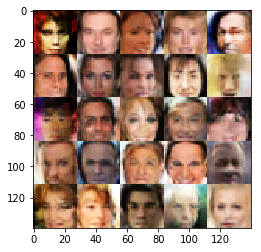

Epoch 2/2... Discriminator Loss: 0.5053... Generator Loss: 1.5934
Epoch 2/2... Discriminator Loss: 1.1330... Generator Loss: 0.5315
Epoch 2/2... Discriminator Loss: 1.0910... Generator Loss: 0.5648
Epoch 2/2... Discriminator Loss: 1.1230... Generator Loss: 0.5320
Epoch 2/2... Discriminator Loss: 0.7249... Generator Loss: 0.9210
Epoch 2/2... Discriminator Loss: 0.8356... Generator Loss: 0.7383
Epoch 2/2... Discriminator Loss: 0.6507... Generator Loss: 0.9787
Epoch 2/2... Discriminator Loss: 0.7914... Generator Loss: 0.8969
Epoch 2/2... Discriminator Loss: 0.9061... Generator Loss: 0.8516
Epoch 2/2... Discriminator Loss: 0.5153... Generator Loss: 1.8296


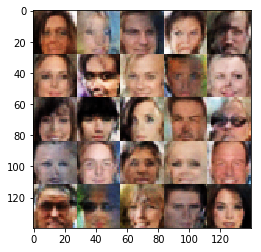

Epoch 2/2... Discriminator Loss: 0.5076... Generator Loss: 1.2710
Epoch 2/2... Discriminator Loss: 0.8771... Generator Loss: 0.7465
Epoch 2/2... Discriminator Loss: 0.5478... Generator Loss: 1.0936
Epoch 2/2... Discriminator Loss: 0.6578... Generator Loss: 1.0903
Epoch 2/2... Discriminator Loss: 0.9731... Generator Loss: 0.7585
Epoch 2/2... Discriminator Loss: 0.2246... Generator Loss: 2.1832
Epoch 2/2... Discriminator Loss: 0.8777... Generator Loss: 0.7390
Epoch 2/2... Discriminator Loss: 0.5452... Generator Loss: 1.4230
Epoch 2/2... Discriminator Loss: 0.8630... Generator Loss: 0.8651
Epoch 2/2... Discriminator Loss: 0.7771... Generator Loss: 0.8018


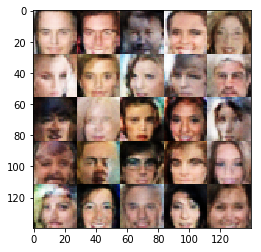

Epoch 2/2... Discriminator Loss: 0.8137... Generator Loss: 1.2400
Epoch 2/2... Discriminator Loss: 0.7247... Generator Loss: 1.0773
Epoch 2/2... Discriminator Loss: 1.3104... Generator Loss: 0.3684
Epoch 2/2... Discriminator Loss: 0.6081... Generator Loss: 1.1126
Epoch 2/2... Discriminator Loss: 0.8299... Generator Loss: 0.6836
Epoch 2/2... Discriminator Loss: 0.6313... Generator Loss: 1.3182
Epoch 2/2... Discriminator Loss: 0.7298... Generator Loss: 0.8631
Epoch 2/2... Discriminator Loss: 0.7753... Generator Loss: 0.9704
Epoch 2/2... Discriminator Loss: 0.9298... Generator Loss: 0.6932
Epoch 2/2... Discriminator Loss: 0.6208... Generator Loss: 1.1552


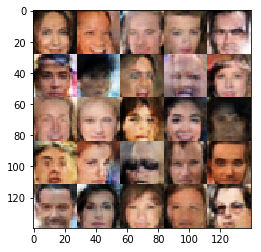

Epoch 2/2... Discriminator Loss: 1.0673... Generator Loss: 0.7401
Epoch 2/2... Discriminator Loss: 0.4927... Generator Loss: 1.1399
Epoch 2/2... Discriminator Loss: 0.8392... Generator Loss: 0.7295
Epoch 2/2... Discriminator Loss: 0.6161... Generator Loss: 1.4441
Epoch 2/2... Discriminator Loss: 0.4428... Generator Loss: 1.4191
Epoch 2/2... Discriminator Loss: 0.6642... Generator Loss: 1.0550
Epoch 2/2... Discriminator Loss: 0.8148... Generator Loss: 0.7988
Epoch 2/2... Discriminator Loss: 0.4897... Generator Loss: 1.5619
Epoch 2/2... Discriminator Loss: 0.7713... Generator Loss: 1.1553
Epoch 2/2... Discriminator Loss: 0.7326... Generator Loss: 0.9381


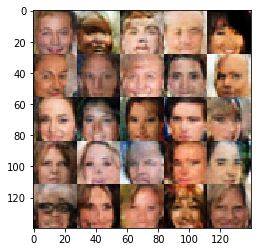

Epoch 2/2... Discriminator Loss: 0.9544... Generator Loss: 0.5938
Epoch 2/2... Discriminator Loss: 0.7580... Generator Loss: 0.9809
Epoch 2/2... Discriminator Loss: 0.6298... Generator Loss: 1.0418
Epoch 2/2... Discriminator Loss: 0.5222... Generator Loss: 1.0488
Epoch 2/2... Discriminator Loss: 0.5453... Generator Loss: 1.5111
Epoch 2/2... Discriminator Loss: 0.7270... Generator Loss: 1.0074
Epoch 2/2... Discriminator Loss: 0.3380... Generator Loss: 1.8997
Epoch 2/2... Discriminator Loss: 0.7137... Generator Loss: 1.3208
Epoch 2/2... Discriminator Loss: 0.4360... Generator Loss: 1.6601
Epoch 2/2... Discriminator Loss: 0.5281... Generator Loss: 1.2762


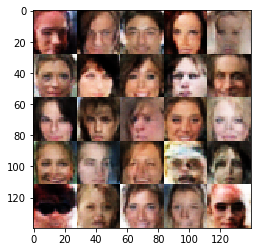

Epoch 2/2... Discriminator Loss: 0.6648... Generator Loss: 1.3476
Epoch 2/2... Discriminator Loss: 0.8642... Generator Loss: 0.8555
Epoch 2/2... Discriminator Loss: 0.5499... Generator Loss: 1.0541
Epoch 2/2... Discriminator Loss: 0.3796... Generator Loss: 1.5422
Epoch 2/2... Discriminator Loss: 0.5894... Generator Loss: 1.1226
Epoch 2/2... Discriminator Loss: 1.0554... Generator Loss: 0.5706
Epoch 2/2... Discriminator Loss: 0.7259... Generator Loss: 0.8265
Epoch 2/2... Discriminator Loss: 0.5305... Generator Loss: 1.3729
Epoch 2/2... Discriminator Loss: 0.3761... Generator Loss: 1.5144
Epoch 2/2... Discriminator Loss: 1.1211... Generator Loss: 0.5034


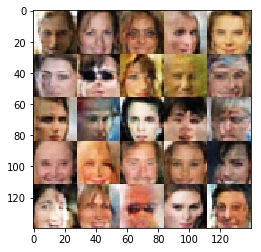

Epoch 2/2... Discriminator Loss: 1.7018... Generator Loss: 0.3127
Epoch 2/2... Discriminator Loss: 0.4371... Generator Loss: 1.5656
Epoch 2/2... Discriminator Loss: 0.4623... Generator Loss: 1.4051
Epoch 2/2... Discriminator Loss: 0.4564... Generator Loss: 1.4666
Epoch 2/2... Discriminator Loss: 0.5732... Generator Loss: 1.1545
Epoch 2/2... Discriminator Loss: 0.6440... Generator Loss: 1.0920
Epoch 2/2... Discriminator Loss: 0.7660... Generator Loss: 1.3069
Epoch 2/2... Discriminator Loss: 0.4636... Generator Loss: 1.3799
Epoch 2/2... Discriminator Loss: 0.6930... Generator Loss: 1.0079
Epoch 2/2... Discriminator Loss: 0.7476... Generator Loss: 0.8339


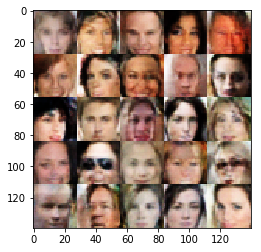

Epoch 2/2... Discriminator Loss: 0.7694... Generator Loss: 0.8884
Epoch 2/2... Discriminator Loss: 0.8059... Generator Loss: 0.7951
Epoch 2/2... Discriminator Loss: 0.7045... Generator Loss: 1.0009
Epoch 2/2... Discriminator Loss: 0.5607... Generator Loss: 1.1735
Epoch 2/2... Discriminator Loss: 0.3344... Generator Loss: 1.9754
Epoch 2/2... Discriminator Loss: 0.5288... Generator Loss: 1.2983
Epoch 2/2... Discriminator Loss: 0.3068... Generator Loss: 1.7498
Epoch 2/2... Discriminator Loss: 0.4977... Generator Loss: 1.3990
Epoch 2/2... Discriminator Loss: 1.0191... Generator Loss: 0.6306
Epoch 2/2... Discriminator Loss: 0.2592... Generator Loss: 1.7684


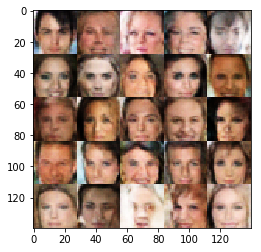

Epoch 2/2... Discriminator Loss: 0.7652... Generator Loss: 1.4956
Epoch 2/2... Discriminator Loss: 1.2232... Generator Loss: 0.4463
Epoch 2/2... Discriminator Loss: 0.8602... Generator Loss: 0.8227
Epoch 2/2... Discriminator Loss: 0.6373... Generator Loss: 1.0560
Epoch 2/2... Discriminator Loss: 0.6375... Generator Loss: 1.1331
Epoch 2/2... Discriminator Loss: 0.8246... Generator Loss: 0.8053
Epoch 2/2... Discriminator Loss: 1.3697... Generator Loss: 0.3529
Epoch 2/2... Discriminator Loss: 0.6944... Generator Loss: 1.0139
Epoch 2/2... Discriminator Loss: 0.2514... Generator Loss: 2.7212
Epoch 2/2... Discriminator Loss: 0.7350... Generator Loss: 0.9885


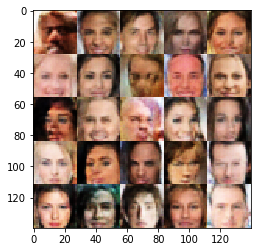

Epoch 2/2... Discriminator Loss: 0.6863... Generator Loss: 1.0560
Epoch 2/2... Discriminator Loss: 1.1720... Generator Loss: 0.4869
Epoch 2/2... Discriminator Loss: 0.8184... Generator Loss: 0.8176
Epoch 2/2... Discriminator Loss: 0.7398... Generator Loss: 0.8256
Epoch 2/2... Discriminator Loss: 0.7468... Generator Loss: 0.8508
Epoch 2/2... Discriminator Loss: 1.0863... Generator Loss: 0.5462
Epoch 2/2... Discriminator Loss: 0.6815... Generator Loss: 1.1312
Epoch 2/2... Discriminator Loss: 0.9191... Generator Loss: 0.7242
Epoch 2/2... Discriminator Loss: 0.4379... Generator Loss: 1.2943
Epoch 2/2... Discriminator Loss: 0.8223... Generator Loss: 0.8325


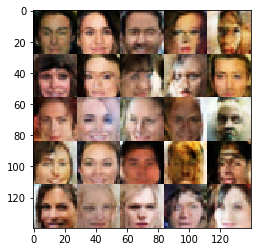

Epoch 2/2... Discriminator Loss: 0.4921... Generator Loss: 1.1803
Epoch 2/2... Discriminator Loss: 0.5357... Generator Loss: 1.0419
Epoch 2/2... Discriminator Loss: 0.4900... Generator Loss: 1.3412
Epoch 2/2... Discriminator Loss: 0.7860... Generator Loss: 1.2193
Epoch 2/2... Discriminator Loss: 0.6862... Generator Loss: 0.8412
Epoch 2/2... Discriminator Loss: 0.5341... Generator Loss: 1.5769
Epoch 2/2... Discriminator Loss: 0.3930... Generator Loss: 1.7412
Epoch 2/2... Discriminator Loss: 0.4644... Generator Loss: 1.4053
Epoch 2/2... Discriminator Loss: 1.1350... Generator Loss: 0.4914
Epoch 2/2... Discriminator Loss: 0.7236... Generator Loss: 0.8471


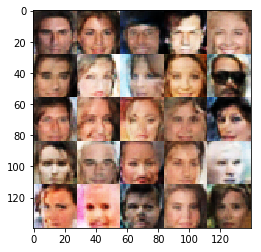

Epoch 2/2... Discriminator Loss: 0.9049... Generator Loss: 0.8193
Epoch 2/2... Discriminator Loss: 0.5198... Generator Loss: 1.4075
Epoch 2/2... Discriminator Loss: 0.8431... Generator Loss: 1.1100
Epoch 2/2... Discriminator Loss: 0.3878... Generator Loss: 1.5003
Epoch 2/2... Discriminator Loss: 0.8124... Generator Loss: 0.8600
Epoch 2/2... Discriminator Loss: 0.7813... Generator Loss: 0.8443
Epoch 2/2... Discriminator Loss: 0.8207... Generator Loss: 0.9037
Epoch 2/2... Discriminator Loss: 0.3069... Generator Loss: 1.8593
Epoch 2/2... Discriminator Loss: 0.7066... Generator Loss: 1.6023
Epoch 2/2... Discriminator Loss: 0.2729... Generator Loss: 2.4941


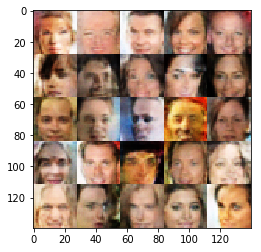

Epoch 2/2... Discriminator Loss: 0.5802... Generator Loss: 1.3340
Epoch 2/2... Discriminator Loss: 0.5961... Generator Loss: 0.9896
Epoch 2/2... Discriminator Loss: 0.4203... Generator Loss: 1.5838
Epoch 2/2... Discriminator Loss: 0.7715... Generator Loss: 0.9266
Epoch 2/2... Discriminator Loss: 0.5312... Generator Loss: 1.2749
Epoch 2/2... Discriminator Loss: 0.6028... Generator Loss: 1.1420
Epoch 2/2... Discriminator Loss: 0.9939... Generator Loss: 0.7098
Epoch 2/2... Discriminator Loss: 0.6223... Generator Loss: 1.1442
Epoch 2/2... Discriminator Loss: 0.7279... Generator Loss: 1.0917
Epoch 2/2... Discriminator Loss: 0.5667... Generator Loss: 1.4278


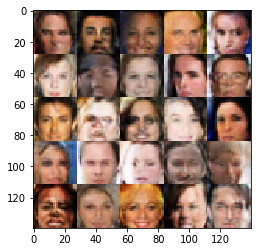

Epoch 2/2... Discriminator Loss: 0.7222... Generator Loss: 0.9160
Epoch 2/2... Discriminator Loss: 0.4346... Generator Loss: 1.4257
Epoch 2/2... Discriminator Loss: 0.2958... Generator Loss: 2.1496
Epoch 2/2... Discriminator Loss: 0.5925... Generator Loss: 1.1411
Epoch 2/2... Discriminator Loss: 0.7637... Generator Loss: 0.8298
Epoch 2/2... Discriminator Loss: 1.0945... Generator Loss: 0.5623
Epoch 2/2... Discriminator Loss: 0.7854... Generator Loss: 0.8581
Epoch 2/2... Discriminator Loss: 0.3658... Generator Loss: 1.7900
Epoch 2/2... Discriminator Loss: 0.6474... Generator Loss: 1.1198
Epoch 2/2... Discriminator Loss: 0.9908... Generator Loss: 2.2331


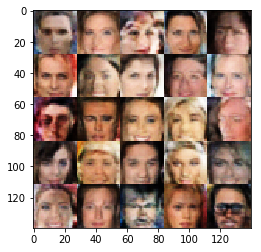

Epoch 2/2... Discriminator Loss: 0.7848... Generator Loss: 0.9379
Epoch 2/2... Discriminator Loss: 0.4013... Generator Loss: 1.7546
Epoch 2/2... Discriminator Loss: 0.4538... Generator Loss: 1.3410
Epoch 2/2... Discriminator Loss: 0.3366... Generator Loss: 1.4840
Epoch 2/2... Discriminator Loss: 0.8913... Generator Loss: 0.9210
Epoch 2/2... Discriminator Loss: 1.0298... Generator Loss: 0.5669
Epoch 2/2... Discriminator Loss: 1.2355... Generator Loss: 0.4887
Epoch 2/2... Discriminator Loss: 0.7362... Generator Loss: 0.9986
Epoch 2/2... Discriminator Loss: 0.5295... Generator Loss: 1.1005
Epoch 2/2... Discriminator Loss: 0.9099... Generator Loss: 0.6698


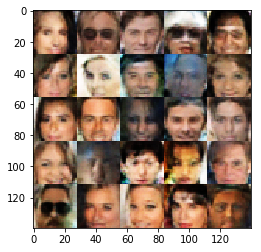

Epoch 2/2... Discriminator Loss: 0.6843... Generator Loss: 1.4047
Epoch 2/2... Discriminator Loss: 0.7714... Generator Loss: 0.8711
Epoch 2/2... Discriminator Loss: 0.8848... Generator Loss: 0.6746
Epoch 2/2... Discriminator Loss: 0.8064... Generator Loss: 0.7007
Epoch 2/2... Discriminator Loss: 0.4164... Generator Loss: 1.3428
Epoch 2/2... Discriminator Loss: 0.4030... Generator Loss: 1.4248
Epoch 2/2... Discriminator Loss: 0.5398... Generator Loss: 1.4254
Epoch 2/2... Discriminator Loss: 0.4776... Generator Loss: 1.2822
Epoch 2/2... Discriminator Loss: 0.8181... Generator Loss: 0.7922
Epoch 2/2... Discriminator Loss: 0.8248... Generator Loss: 0.7869


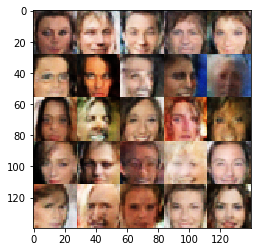

Epoch 2/2... Discriminator Loss: 1.1173... Generator Loss: 0.4961
Epoch 2/2... Discriminator Loss: 0.7453... Generator Loss: 0.8666
Epoch 2/2... Discriminator Loss: 0.4842... Generator Loss: 1.2752
Epoch 2/2... Discriminator Loss: 0.6837... Generator Loss: 0.9596
Epoch 2/2... Discriminator Loss: 0.9866... Generator Loss: 0.5944
Epoch 2/2... Discriminator Loss: 0.5606... Generator Loss: 1.3921
Epoch 2/2... Discriminator Loss: 0.7900... Generator Loss: 1.9682
Epoch 2/2... Discriminator Loss: 0.2697... Generator Loss: 1.9432
Epoch 2/2... Discriminator Loss: 1.0655... Generator Loss: 0.5382
Epoch 2/2... Discriminator Loss: 0.5395... Generator Loss: 1.3683


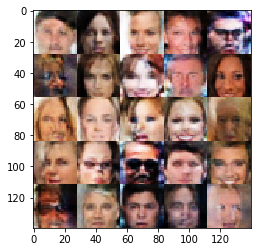

Epoch 2/2... Discriminator Loss: 0.5539... Generator Loss: 1.4956
Epoch 2/2... Discriminator Loss: 0.6392... Generator Loss: 1.1923
Epoch 2/2... Discriminator Loss: 0.7818... Generator Loss: 0.7860
Epoch 2/2... Discriminator Loss: 0.9011... Generator Loss: 0.7911
Epoch 2/2... Discriminator Loss: 0.5368... Generator Loss: 1.2408
Epoch 2/2... Discriminator Loss: 0.4695... Generator Loss: 1.2616
Epoch 2/2... Discriminator Loss: 0.7844... Generator Loss: 0.9380
Epoch 2/2... Discriminator Loss: 0.6575... Generator Loss: 1.0467
Epoch 2/2... Discriminator Loss: 0.5866... Generator Loss: 1.1612
Epoch 2/2... Discriminator Loss: 0.3119... Generator Loss: 2.3377


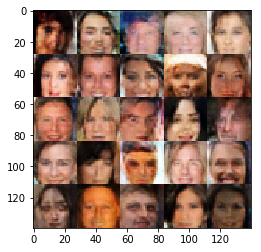

Epoch 2/2... Discriminator Loss: 0.4536... Generator Loss: 1.5678
Epoch 2/2... Discriminator Loss: 0.8456... Generator Loss: 0.6962
Epoch 2/2... Discriminator Loss: 0.5774... Generator Loss: 1.1687
Epoch 2/2... Discriminator Loss: 0.8393... Generator Loss: 0.7640
Epoch 2/2... Discriminator Loss: 0.6459... Generator Loss: 1.0439
Epoch 2/2... Discriminator Loss: 0.7051... Generator Loss: 0.9679
Epoch 2/2... Discriminator Loss: 0.5638... Generator Loss: 1.2624
Epoch 2/2... Discriminator Loss: 0.9244... Generator Loss: 0.6777
Epoch 2/2... Discriminator Loss: 0.5676... Generator Loss: 1.0813
Epoch 2/2... Discriminator Loss: 0.4143... Generator Loss: 1.5018


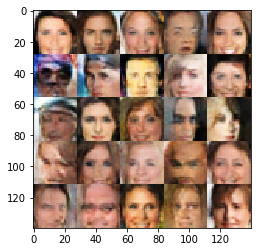

Epoch 2/2... Discriminator Loss: 0.7937... Generator Loss: 0.8558
Epoch 2/2... Discriminator Loss: 1.3776... Generator Loss: 0.3557
Epoch 2/2... Discriminator Loss: 0.5288... Generator Loss: 1.2084
Epoch 2/2... Discriminator Loss: 0.8381... Generator Loss: 0.7401
Epoch 2/2... Discriminator Loss: 0.6728... Generator Loss: 1.3063
Epoch 2/2... Discriminator Loss: 0.4683... Generator Loss: 1.9588
Epoch 2/2... Discriminator Loss: 0.8165... Generator Loss: 0.7432
Epoch 2/2... Discriminator Loss: 0.4876... Generator Loss: 1.1474
Epoch 2/2... Discriminator Loss: 0.6834... Generator Loss: 1.0720
Epoch 2/2... Discriminator Loss: 0.5547... Generator Loss: 1.1732


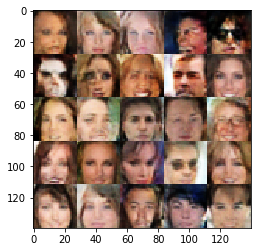

Epoch 2/2... Discriminator Loss: 0.6983... Generator Loss: 0.9248
Epoch 2/2... Discriminator Loss: 1.0074... Generator Loss: 0.5792
Epoch 2/2... Discriminator Loss: 0.7434... Generator Loss: 1.2556
Epoch 2/2... Discriminator Loss: 0.6902... Generator Loss: 0.8709
Epoch 2/2... Discriminator Loss: 0.8411... Generator Loss: 0.8298
Epoch 2/2... Discriminator Loss: 0.4712... Generator Loss: 1.8386
Epoch 2/2... Discriminator Loss: 0.6828... Generator Loss: 1.0493
Epoch 2/2... Discriminator Loss: 0.2852... Generator Loss: 1.9544
Epoch 2/2... Discriminator Loss: 0.6901... Generator Loss: 0.9822
Epoch 2/2... Discriminator Loss: 0.8513... Generator Loss: 0.9275


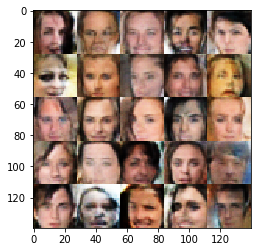

Epoch 2/2... Discriminator Loss: 0.5306... Generator Loss: 1.2765
Epoch 2/2... Discriminator Loss: 0.5937... Generator Loss: 1.0910
Epoch 2/2... Discriminator Loss: 0.5876... Generator Loss: 1.1691
Epoch 2/2... Discriminator Loss: 0.5483... Generator Loss: 1.2675
Epoch 2/2... Discriminator Loss: 0.3791... Generator Loss: 1.6777
Epoch 2/2... Discriminator Loss: 0.4141... Generator Loss: 1.6582
Epoch 2/2... Discriminator Loss: 0.6318... Generator Loss: 1.3191
Epoch 2/2... Discriminator Loss: 1.0274... Generator Loss: 0.6057
Epoch 2/2... Discriminator Loss: 0.6908... Generator Loss: 1.1095
Epoch 2/2... Discriminator Loss: 0.9915... Generator Loss: 0.6154


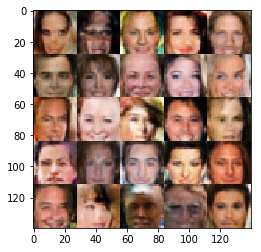

Epoch 2/2... Discriminator Loss: 0.5240... Generator Loss: 1.1644
Epoch 2/2... Discriminator Loss: 0.8099... Generator Loss: 0.7810
Epoch 2/2... Discriminator Loss: 1.1352... Generator Loss: 0.5412
Epoch 2/2... Discriminator Loss: 0.7341... Generator Loss: 1.2770
Epoch 2/2... Discriminator Loss: 0.7688... Generator Loss: 0.9276
Epoch 2/2... Discriminator Loss: 0.6981... Generator Loss: 1.1010
Epoch 2/2... Discriminator Loss: 0.4523... Generator Loss: 1.7165
Epoch 2/2... Discriminator Loss: 0.7010... Generator Loss: 1.4093
Epoch 2/2... Discriminator Loss: 0.8613... Generator Loss: 0.8598
Epoch 2/2... Discriminator Loss: 0.5129... Generator Loss: 1.4935


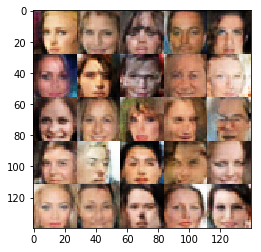

Epoch 2/2... Discriminator Loss: 0.9470... Generator Loss: 0.6708
Epoch 2/2... Discriminator Loss: 0.5981... Generator Loss: 1.3331
Epoch 2/2... Discriminator Loss: 0.2320... Generator Loss: 2.6127
Epoch 2/2... Discriminator Loss: 1.1255... Generator Loss: 0.5093
Epoch 2/2... Discriminator Loss: 0.4654... Generator Loss: 1.5446
Epoch 2/2... Discriminator Loss: 0.9347... Generator Loss: 0.7002
Epoch 2/2... Discriminator Loss: 0.8293... Generator Loss: 0.7260
Epoch 2/2... Discriminator Loss: 0.5736... Generator Loss: 1.1914
Epoch 2/2... Discriminator Loss: 0.6112... Generator Loss: 1.3940
Epoch 2/2... Discriminator Loss: 0.4825... Generator Loss: 1.3382


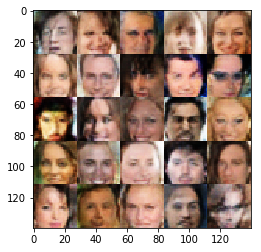

Epoch 2/2... Discriminator Loss: 0.5727... Generator Loss: 1.0080
Epoch 2/2... Discriminator Loss: 0.7621... Generator Loss: 0.7514
Epoch 2/2... Discriminator Loss: 0.5475... Generator Loss: 1.6712
Epoch 2/2... Discriminator Loss: 0.4746... Generator Loss: 1.4878
Epoch 2/2... Discriminator Loss: 1.0096... Generator Loss: 0.6025
Epoch 2/2... Discriminator Loss: 0.6291... Generator Loss: 1.0774
Epoch 2/2... Discriminator Loss: 1.1947... Generator Loss: 1.5700
Epoch 2/2... Discriminator Loss: 0.4891... Generator Loss: 1.9453
Epoch 2/2... Discriminator Loss: 1.6552... Generator Loss: 0.3328
Epoch 2/2... Discriminator Loss: 1.5650... Generator Loss: 0.2960


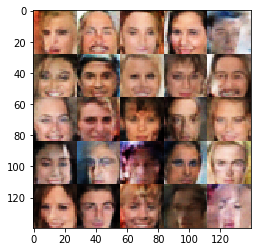

Epoch 2/2... Discriminator Loss: 0.3078... Generator Loss: 1.6420
Epoch 2/2... Discriminator Loss: 0.4425... Generator Loss: 1.4064
Epoch 2/2... Discriminator Loss: 0.8897... Generator Loss: 1.1449
Epoch 2/2... Discriminator Loss: 0.5867... Generator Loss: 1.0865
Epoch 2/2... Discriminator Loss: 1.2884... Generator Loss: 0.3987
Epoch 2/2... Discriminator Loss: 0.7888... Generator Loss: 1.0575
Epoch 2/2... Discriminator Loss: 0.7923... Generator Loss: 0.8123
Epoch 2/2... Discriminator Loss: 0.8138... Generator Loss: 0.8061
Epoch 2/2... Discriminator Loss: 0.5097... Generator Loss: 1.4604
Epoch 2/2... Discriminator Loss: 0.5168... Generator Loss: 1.3159


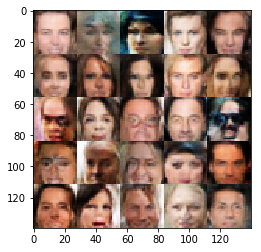

Epoch 2/2... Discriminator Loss: 0.8155... Generator Loss: 0.7006
Epoch 2/2... Discriminator Loss: 0.5583... Generator Loss: 1.1995
Epoch 2/2... Discriminator Loss: 0.4551... Generator Loss: 1.4420
Epoch 2/2... Discriminator Loss: 0.5330... Generator Loss: 1.6211
Epoch 2/2... Discriminator Loss: 0.4251... Generator Loss: 2.2782
Epoch 2/2... Discriminator Loss: 0.4045... Generator Loss: 1.5757
Epoch 2/2... Discriminator Loss: 0.4417... Generator Loss: 1.3761
Epoch 2/2... Discriminator Loss: 1.1786... Generator Loss: 0.4759
Epoch 2/2... Discriminator Loss: 0.7244... Generator Loss: 0.8949
Epoch 2/2... Discriminator Loss: 0.9855... Generator Loss: 0.6539


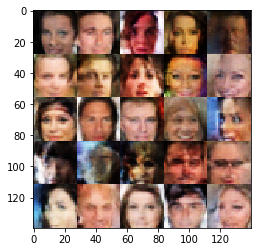

Epoch 2/2... Discriminator Loss: 0.8077... Generator Loss: 0.7462
Epoch 2/2... Discriminator Loss: 0.6586... Generator Loss: 0.9957
Epoch 2/2... Discriminator Loss: 0.8874... Generator Loss: 0.7307
Epoch 2/2... Discriminator Loss: 1.0576... Generator Loss: 0.5026
Epoch 2/2... Discriminator Loss: 0.5622... Generator Loss: 1.1889
Epoch 2/2... Discriminator Loss: 0.6782... Generator Loss: 1.0007
Epoch 2/2... Discriminator Loss: 0.4929... Generator Loss: 1.5104
Epoch 2/2... Discriminator Loss: 0.6961... Generator Loss: 0.9602
Epoch 2/2... Discriminator Loss: 1.2847... Generator Loss: 0.4743
Epoch 2/2... Discriminator Loss: 0.5681... Generator Loss: 1.1179


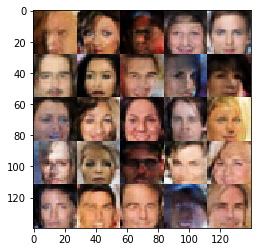

Epoch 2/2... Discriminator Loss: 0.5660... Generator Loss: 1.1861
Epoch 2/2... Discriminator Loss: 0.6296... Generator Loss: 1.1139
Epoch 2/2... Discriminator Loss: 0.6077... Generator Loss: 1.2041
Epoch 2/2... Discriminator Loss: 0.4263... Generator Loss: 1.3484
Epoch 2/2... Discriminator Loss: 0.6974... Generator Loss: 1.0241
Epoch 2/2... Discriminator Loss: 0.4314... Generator Loss: 2.4842
Epoch 2/2... Discriminator Loss: 0.5233... Generator Loss: 1.1773
Epoch 2/2... Discriminator Loss: 0.6773... Generator Loss: 0.9603
Epoch 2/2... Discriminator Loss: 0.6336... Generator Loss: 1.3829
Epoch 2/2... Discriminator Loss: 0.7055... Generator Loss: 1.0037


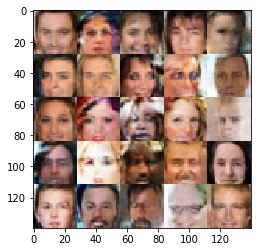

Epoch 2/2... Discriminator Loss: 0.8626... Generator Loss: 0.7423
Epoch 2/2... Discriminator Loss: 0.4779... Generator Loss: 1.2280
Epoch 2/2... Discriminator Loss: 0.7440... Generator Loss: 0.9373
Epoch 2/2... Discriminator Loss: 0.5707... Generator Loss: 1.3518
Epoch 2/2... Discriminator Loss: 0.3384... Generator Loss: 1.8456
Epoch 2/2... Discriminator Loss: 1.2651... Generator Loss: 0.4505
Epoch 2/2... Discriminator Loss: 0.6674... Generator Loss: 0.9200
Epoch 2/2... Discriminator Loss: 0.3628... Generator Loss: 1.5967
Epoch 2/2... Discriminator Loss: 0.9562... Generator Loss: 0.7173
Epoch 2/2... Discriminator Loss: 0.5320... Generator Loss: 1.3560


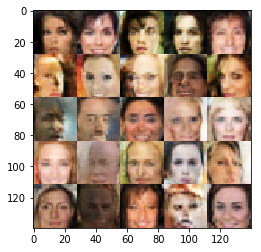

Epoch 2/2... Discriminator Loss: 0.3299... Generator Loss: 1.7107
Epoch 2/2... Discriminator Loss: 0.2010... Generator Loss: 2.2001
Epoch 2/2... Discriminator Loss: 0.4326... Generator Loss: 1.2706
Epoch 2/2... Discriminator Loss: 1.3116... Generator Loss: 0.3844
Epoch 2/2... Discriminator Loss: 0.6462... Generator Loss: 1.4390
Epoch 2/2... Discriminator Loss: 1.5375... Generator Loss: 0.3368


In [19]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.